<!-- PROFILE BADGES (Top Section) -->
<p align="center">
  <a href="https://github.com/ibrahimongoren" target="_blank">
    <img src="https://img.shields.io/badge/GitHub-ibrahimongoren-black?style=for-the-badge&logo=github" alt="GitHub Badge"/>
  </a>
  <a href="https://www.kaggle.com/ibrahimongoren" target="_blank">
    <img src="https://img.shields.io/badge/Kaggle-ibrahimongoren-20BEFF?style=for-the-badge&logo=kaggle" alt="Kaggle Badge"/>
  </a>
</p>

<!-- INTRODUCTION -->
<div align="center">

# 👋 Hello, I'm **İbrahim Ongören**

I'm an Economics graduate and aspiring Data Scientist specialising in _machine learning, econometrics, and financial modelling_.

I’m passionate about using Python to transform raw data into actionable insights and love building repeatable, scalable projects that solve real-world problems — mostly in economics and finance, but also beyond.

---

# **⚾ Baseball Player Salary Prediction using Machine Learning**

Welcome to this end-to-end machine learning project where we aim to **predict the salaries of professional baseball players** using statistical and ensemble-based regression models.  
This notebook demonstrates how **on-field performance metrics** can be translated into **financial valuation**, offering valuable insights for teams, analysts, and agents.

---

---
## **🎯 Objective**

- 📚 Explore the relationship between player performance and salary  
- ⚙️ Apply various machine learning models for salary prediction  
- 🛠️ Engineer features and preprocess data for optimal modeling  
- 🔎 Use `RandomizedSearchCV` and `Optuna` for hyperparameter tuning  
- 🧠 Implement ensemble learning (`Voting` & `Stacking`)  
- 📈 Evaluate performance via **R²**, **RMSE**, and **MAE**

---

## **📦 Dataset Overview**

- **Source**: [Kaggle Dataset](https://www.kaggle.com/datasets/creepycrap/baseball-player-salary-prediction)  
- **Target**: `Salary`  
- **Features**: Batting stats, experience, career performance  
- **Categoricals**: `League`, `Division`, `Team`, `NewLeague`, `ExperienceLevel`  
- **Engineered**: `BattingAverage`, `CareerBattingAvg`, `ExperienceLevel`

---

## **🧪 Techniques Used**

✅ Full ML Workflow  
✅ EDA & Feature Engineering  
✅ One-Hot Encoding + Scaling  
✅ Regularized Linear & Tree-Based Models  
✅ Hyperparameter Optimization (`Optuna`, `RandomizedSearchCV`)  
✅ Model Ensembling (`Voting`, `Stacking`)

---

## **🤖 Models Implemented**

| Model                    | Type                          |
|--------------------------|-------------------------------|
| Linear Regression        | Baseline                     |
| Ridge / Lasso / ElasticNet | Regularized Linear Models  |
| Random Forest            | Bagging Ensemble             |
| XGBoost / LightGBM       | Gradient Boosting            |
| CatBoost                 | Categorical Boosting         |
| Voting / Stacking        | Model Ensembling             |

---

## **📊 Evaluation Metrics**

- 🧠 **R²** — Coefficient of Determination  
- 📉 **RMSE** — Root Mean Squared Error  
- 📉 **MAE** — Mean Absolute Error  
- 📌 Residual and prediction plots for visual validation

---

## **💼 Why It Matters**

- 🏟️ Teams aim to **optimize performance vs. salary**  
- 💼 Agents benefit from **quantitative leverage**  
- 📊 Analysts gain **interpretable, actionable insights**

Data science bridges the gap between statistics and real-world **sports business** decisions.

---

# 📦 Importing Required Packages and Libraries

Before starting our analysis, we import all necessary libraries required for **data preprocessing**, **exploratory analysis**, **feature engineering**, **modeling**, and **evaluation**.

We use:
- 📊 **NumPy** and **Pandas** for data manipulation  
- 📈 **Matplotlib** and **Seaborn** for visualization  
- 🧮 **Scikit-learn** for machine learning modeling and evaluation  
- 🚀 **XGBoost**, **LightGBM**, and **CatBoost** for high-performance gradient boosting  
- 🧪 **Optuna** and **RandomizedSearchCV** for hyperparameter optimization  
- 📚 **Statsmodels** for statistical analysis  


In [1]:
!pip install catboost #(uncomment if running locally)

In [2]:
!pip install optuna

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, cross_validate
from sklearn.feature_selection import VarianceThreshold
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, LassoCV, Ridge, RidgeCV, ElasticNetCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, StackingRegressor, VotingRegressor

from xgboost import XGBRegressor, plot_importance
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

from scipy.stats import skew
from scipy.stats import uniform, randint
import optuna

import warnings
warnings.filterwarnings('ignore')

# Plotting style
plt.style.use('seaborn-whitegrid')
sns.set_palette("deep")
pd.set_option('display.float_format', lambda x: f'{x:.2f}')

# **🔍 Exploratory Data Analysis (EDA)**

In this section, we dive deep into the dataset to uncover patterns, detect anomalies, understand distributions, and explore relationships between variables. This analysis helps inform the modeling choices and guides feature engineering.

---

## **🔹 Data Import and Overview**

We begin by loading the dataset and displaying the basic structure and sample records. This helps us understand the shape of the data and the type of information it contains.

---

In [4]:
df = pd.read_csv('/kaggle/input/baseball-player-salary-prediction/Player.csv')

print(f"The data set contains {df.shape[0]} observations and {df.shape[1]} features.\n")

display(df.head().style.background_gradient(cmap = 'Blues'))

The data set contains 322 observations and 21 features.



,Unnamed: 0,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,-Andy Allanson,293,66,1,30,29,14,1,293,66,1,30,29,14,A,E,446,33,20,nan,A
1,-Alan Ashby,315,81,7,24,38,39,14,3449,835,69,321,414,375,N,W,632,43,10,475.000000,N
2,-Alvin Davis,479,130,18,66,72,76,3,1624,457,63,224,266,263,A,W,880,82,14,480.000000,A
3,-Andre Dawson,496,141,20,65,78,37,11,5628,1575,225,828,838,354,N,E,200,11,3,500.000000,N
4,-Andres Galarraga,321,87,10,39,42,30,2,396,101,12,48,46,33,N,E,805,40,4,91.500000,N


## **🔹 Dataset Information and Missing Values**

We examine the dataset's schema, including data types and the presence of null values. A detailed missing value report is generated to assess the need for imputation or exclusion of any features.

---

In [5]:
# Display column types and non-null counts
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 322 entries, 0 to 321
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  322 non-null    object 
 1   AtBat       322 non-null    int64  
 2   Hits        322 non-null    int64  
 3   HmRun       322 non-null    int64  
 4   Runs        322 non-null    int64  
 5   RBI         322 non-null    int64  
 6   Walks       322 non-null    int64  
 7   Years       322 non-null    int64  
 8   CAtBat      322 non-null    int64  
 9   CHits       322 non-null    int64  
 10  CHmRun      322 non-null    int64  
 11  CRuns       322 non-null    int64  
 12  CRBI        322 non-null    int64  
 13  CWalks      322 non-null    int64  
 14  League      322 non-null    object 
 15  Division    322 non-null    object 
 16  PutOuts     322 non-null    int64  
 17  Assists     322 non-null    int64  
 18  Errors      322 non-null    int64  
 19  Salary      263 non-null    f

In [6]:
# Display missing value count and percentage
missing_data = df.isnull().sum()
missing_percent = (missing_data / len(df)) * 100
missing_df = pd.DataFrame({
    'Missing Values': missing_data,
    'Missing (%)': missing_percent
}).sort_values(by ='Missing (%)', ascending=False)

print("\nMissing Value Overview:")
display(missing_df.style.background_gradient(cmap = 'Reds').format({'Missing (%)': '{:.2f}%'}))


Missing Value Overview:


,Missing Values,Missing (%)
Salary,59,18.32%
Unnamed: 0,0,0.00%
CRuns,0,0.00%
Errors,0,0.00%
Assists,0,0.00%
PutOuts,0,0.00%
Division,0,0.00%
League,0,0.00%
CWalks,0,0.00%
CRBI,0,0.00%


## **🔹 Descriptive Statistics**

This section provides summary statistics (mean, std, min, max, etc.) for each numerical feature, giving insight into the central tendency, spread, and potential outliers in the data.

---

In [7]:
# Summary statistics
print("\nDescriptive Statistics:")
display(df.describe().T.style.background_gradient(cmap='Blues').format("{:.2f}"))


Descriptive Statistics:


,count,mean,std,min,25%,50%,75%,max
AtBat,322.00,380.93,153.40,16.00,255.25,379.50,512.00,687.00
Hits,322.00,101.02,46.45,1.00,64.00,96.00,137.00,238.00
HmRun,322.00,10.77,8.71,0.00,4.00,8.00,16.00,40.00
Runs,322.00,50.91,26.02,0.00,30.25,48.00,69.00,130.00
RBI,322.00,48.03,26.17,0.00,28.00,44.00,64.75,121.00
Walks,322.00,38.74,21.64,0.00,22.00,35.00,53.00,105.00
Years,322.00,7.44,4.93,1.00,4.00,6.00,11.00,24.00
CAtBat,322.00,2648.68,2324.21,19.00,816.75,1928.00,3924.25,14053.00
CHits,322.00,717.57,654.47,4.00,209.00,508.00,1059.25,4256.00
CHmRun,322.00,69.49,86.27,0.00,14.00,37.50,90.00,548.00


## **🔹 Categorical Feature Distribution (Countplots)**

Countplots help us understand the distribution of players across categorical groups (e.g., League). This is useful to identify class imbalance and group proportions.

---

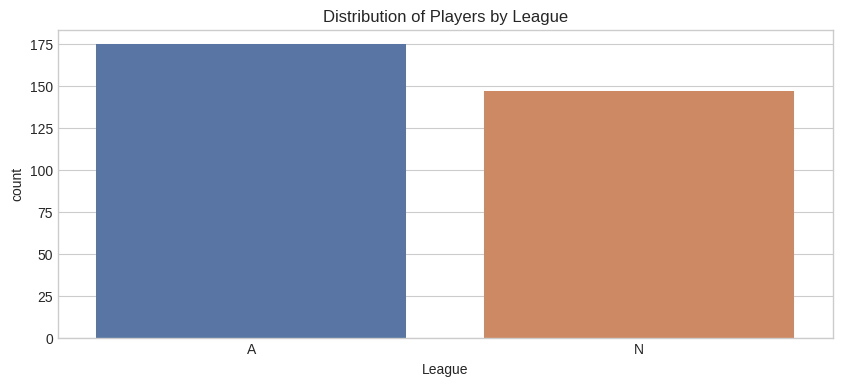

In [8]:
plt.figure(figsize = (10, 4))
sns.countplot(data = df, x = 'League')
plt.title('Distribution of Players by League')
plt.show()

## **🔹 Feature Types**

We categorize features into numerical and categorical types, which is essential for determining suitable visualization methods, encoding strategies, and model input formatting.

---

In [9]:
# Identify numerical and categorical features
categorical_features = df.select_dtypes(include = 'object').columns.tolist()
numerical_features = df.select_dtypes(include = ['int64', 'float64']).drop(columns = ['Salary']).columns.tolist()

print("Categorical Features:", categorical_features)
print("Numerical Features:", numerical_features)

Categorical Features: ['Unnamed: 0', 'League', 'Division', 'NewLeague']
Numerical Features: ['AtBat', 'Hits', 'HmRun', 'Runs', 'RBI', 'Walks', 'Years', 'CAtBat', 'CHits', 'CHmRun', 'CRuns', 'CRBI', 'CWalks', 'PutOuts', 'Assists', 'Errors']


## **🔹 Pairplot (Multivariate Exploration)**

Pairplots are useful for visualizing pairwise relationships between selected features and the target variable (Salary). They also allow us to observe class separation in categorical variables.

---

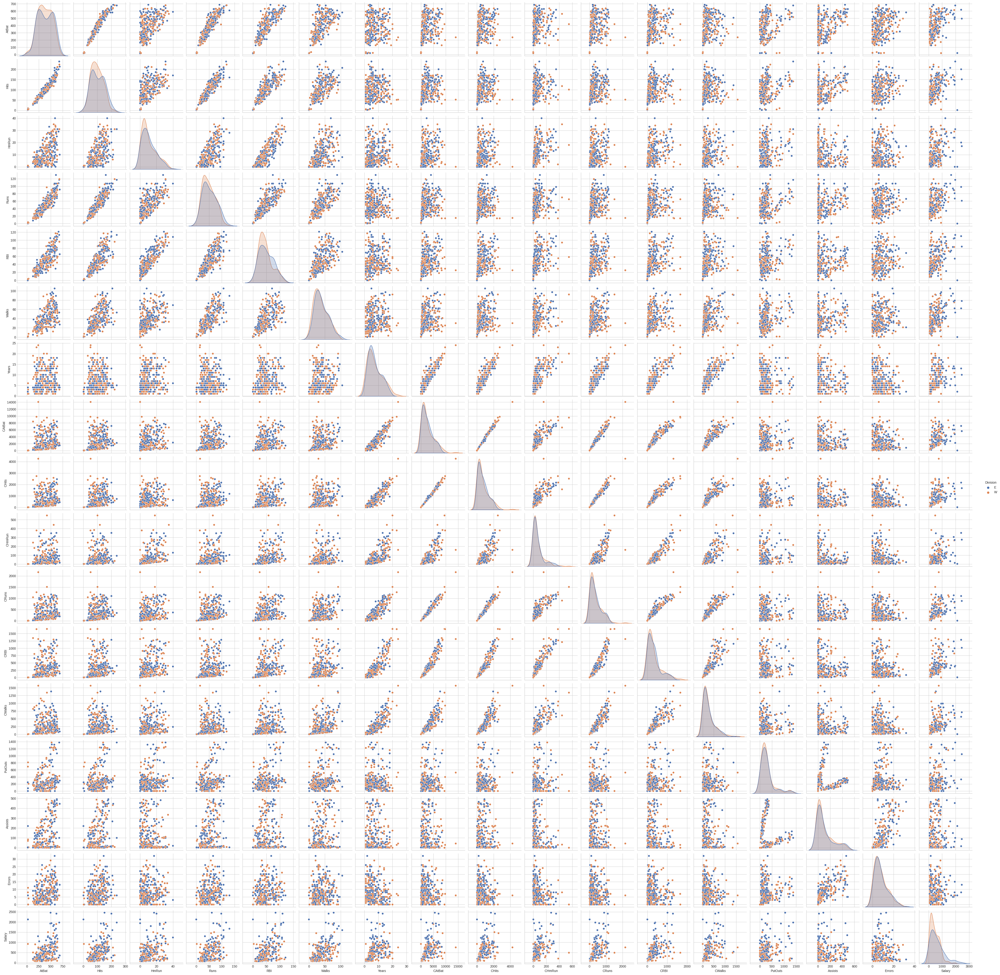

In [10]:
sns.pairplot(df, vars = numerical_features + ['Salary'], hue = 'Division')
plt.show()

## **🔹 Categorical Variables: Distribution Visualizations**

We use boxenplots to analyze how categorical variables like `League`, `Division`, and `NewLeague` relate to numerical performance metrics such as `Assists`, `Hits`, and `Salary`. This helps identify category-wise trends and distribution differences.

---

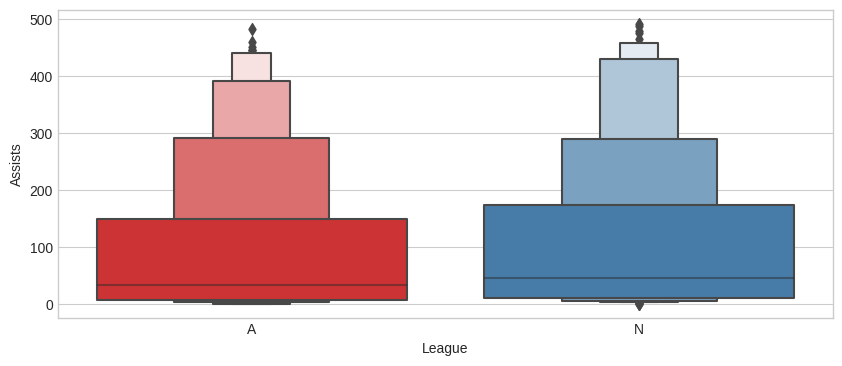

In [11]:
# Boxenplot: Assists by League
plt.figure(figsize = (10, 4))
sns.boxenplot(x = df['League'], y = df['Assists'], palette = "Set1")
plt.show()

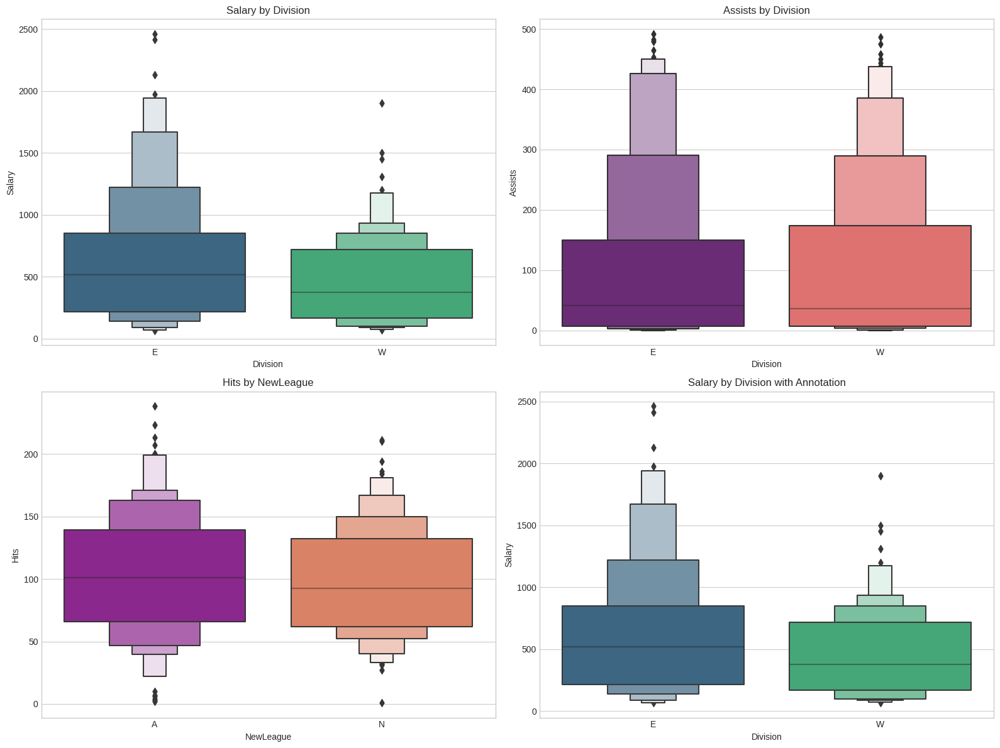

In [12]:
# Boxenplots
fig, axs = plt.subplots(2, 2, figsize = (16, 12))

sns.boxenplot(x = df['Division'], y = df['Salary'], palette = "viridis", ax = axs[0, 0])
axs[0, 0].set_title('Salary by Division')

sns.boxenplot(x = df['Division'], y = df['Assists'], palette = "magma", ax = axs[0, 1])
axs[0, 1].set_title('Assists by Division')

sns.boxenplot(x = df['NewLeague'], y = df['Hits'], palette = "plasma", ax = axs[1, 0])
axs[1, 0].set_title('Hits by NewLeague')

sns.boxenplot(x = df['Division'], y = df['Salary'], palette = "viridis", ax = axs[1, 1])
axs[1, 1].set_title('Salary by Division with Annotation')

plt.tight_layout()
plt.show()

## **🔹 Target Variable Analysis: Salary**

We analyze the distribution of the target variable (`Salary`) using histograms, boxplots, and violin plots. Understanding the distribution is important for choosing appropriate regression models and transformations.

---

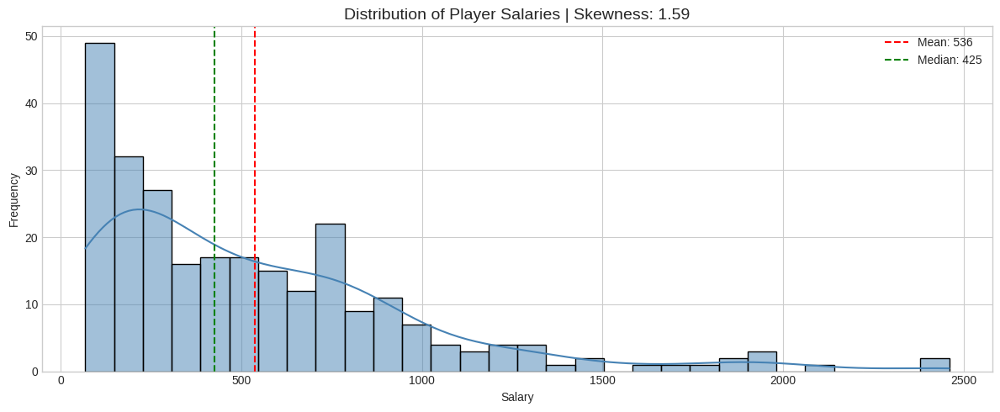

In [13]:
# Calculate skewness
skew_value = df['Salary'].skew()

# Distribution plot
plt.figure(figsize = (12, 5))
sns.histplot(df['Salary'], kde = True, bins = 30, color = 'steelblue', edgecolor = 'black')
plt.axvline(df['Salary'].mean(), color = 'red', linestyle = '--', label = f"Mean: {df['Salary'].mean():.0f}")
plt.axvline(df['Salary'].median(), color = 'green', linestyle = '--', label = f"Median: {df['Salary'].median():.0f}")
plt.title(f"Distribution of Player Salaries | Skewness: {skew_value:.2f}", fontsize=14)
plt.xlabel("Salary")
plt.ylabel("Frequency")
plt.legend()
plt.tight_layout()
plt.show()

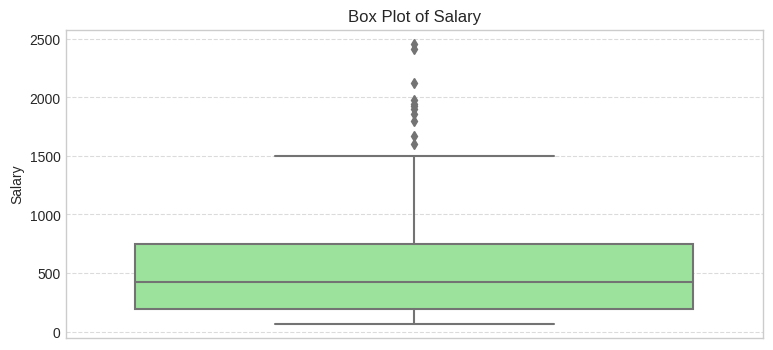

In [14]:
# Boxplot 
plt.figure(figsize = (9, 4))
sns.boxplot(y = df['Salary'], color = 'lightgreen')
plt.title('Box Plot of Salary')
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
plt.show()

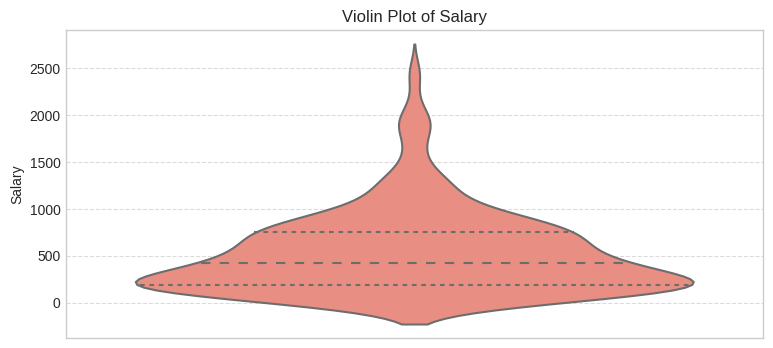

In [15]:
# Violin plot
plt.figure(figsize = (9, 4))
sns.violinplot(y = df['Salary'], color = 'salmon', inner = 'quartile')
plt.title('Violin Plot of Salary')
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
plt.show()

## **🔹 Outlier Detection (IQR Method)**

Outliers can skew model results, especially in regression tasks. We use the Interquartile Range (IQR) method to detect high-end salary outliers and quantify their impact.

---

In [16]:
q1 = df['Salary'].quantile(0.25)
q3 = df['Salary'].quantile(0.75)
iqr = q3 - q1
upper_bound = q3 + 1.5 * iqr

print(f"Q1 (25th percentile): {q1:.2f}")
print(f"Q3 (75th percentile): {q3:.2f}")
print(f"IQR: {iqr:.2f}")
print(f"Upper Bound (Outlier Threshold): {upper_bound:.2f}")
print(f"Number of high-end outliers: {(df['Salary'] > upper_bound).sum()}")

Q1 (25th percentile): 190.00
Q3 (75th percentile): 750.00
IQR: 560.00
Upper Bound (Outlier Threshold): 1590.00
Number of high-end outliers: 11


## **🔹 Feature Engineering**

We create new features such as batting averages and experience level to enrich the dataset. Feature engineering often leads to performance gains by adding domain-specific insights to the model.

---

In [17]:
# Imputation
df['Salary'] = df['Salary'].fillna(df['Salary'].median())

# New features
df['BattingAverage'] = df['Hits'] / df['AtBat']
df['CareerBattingAvg'] = df['CHits'] / df['CAtBat']
df['ExperienceLevel'] = pd.cut(df['Years'], bins = [0, 5, 10, 25], labels = ['Junior', 'Mid', 'Senior'])

# Replace inf and NaN
df.replace([np.inf, -np.inf], np.nan, inplace = True)
df['BattingAverage'] = df['BattingAverage'].fillna(0)
df['CareerBattingAvg'] = df['CareerBattingAvg'].fillna(0)

## **🔹 Correlation Matrix**

A heatmap of the Pearson correlation matrix for numerical features allows us to assess multicollinearity and relationships between predictors and the target variable.

---

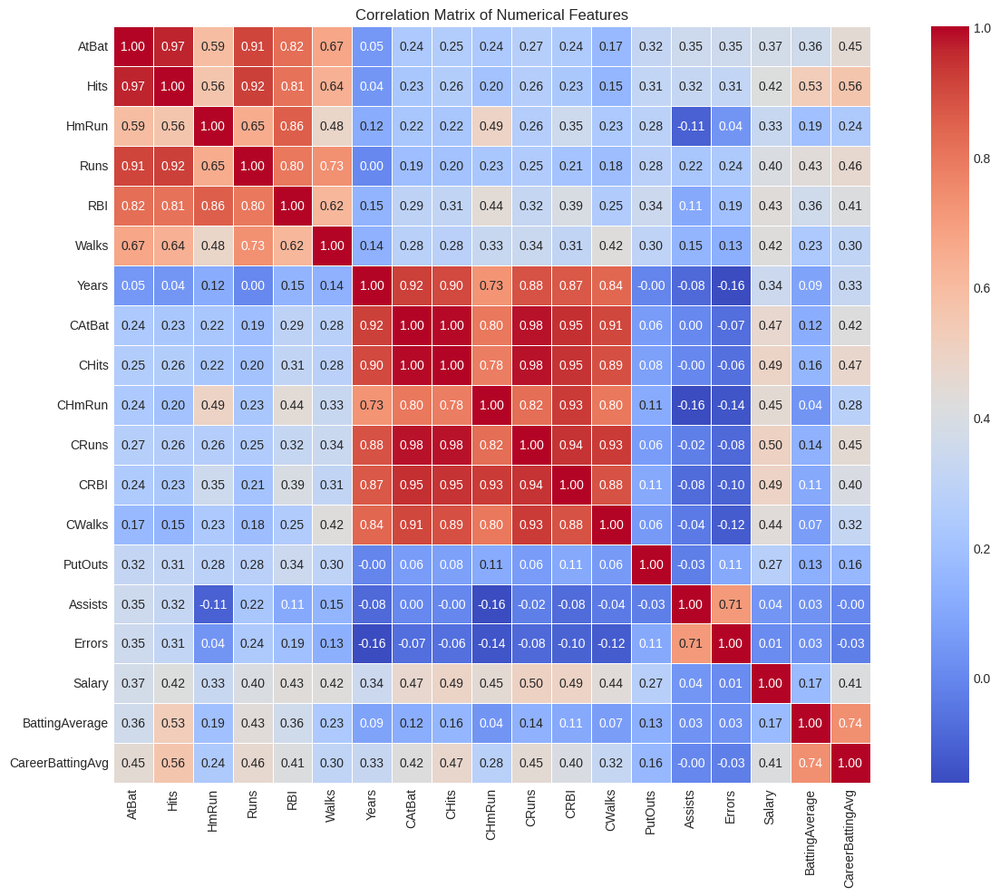

In [18]:
# Correlation matrix
engineered_features = ['BattingAverage', 'CareerBattingAvg']
num_cols_extended = numerical_features + ['Salary'] + engineered_features

plt.figure(figsize = (14, 10))
corr = df[num_cols_extended].corr()
sns.heatmap(corr, annot = True, fmt = ".2f", cmap = 'coolwarm', square = True, linewidths = 0.5)
plt.title("Correlation Matrix of Numerical Features")
plt.tight_layout()
plt.show()

## **🔹 Correlation with Target (Barplot)**

A barplot shows the correlation of all features with the target variable Salary, helping prioritize variables during modeling and feature selection.

---

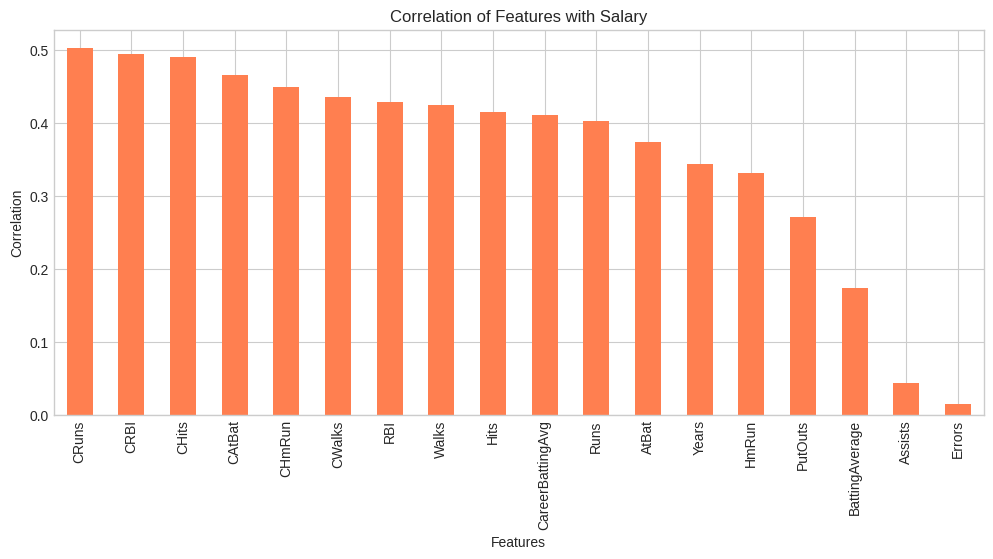

In [19]:
plt.figure(figsize = (12, 5))
target_corr = corr['Salary'].drop('Salary').sort_values(ascending = False)
target_corr.plot(kind = 'bar', color = 'coral')
plt.title('Correlation of Features with Salary')
plt.xlabel('Features')
plt.ylabel('Correlation')
plt.show()

## **🔹 Encoding and Scaling**

We apply one-hot encoding to categorical variables and remove irrelevant features. Feature scaling is then performed to standardize the input data for model compatibility.

---

In [20]:
# Drop unnecessary column
df.drop(columns = ['Unnamed: 0'], inplace = True)

# One-hot encoding
df_encoded = pd.get_dummies(df, columns = ['League', 'Division', 'NewLeague', 'ExperienceLevel'], drop_first = True)
print(f"Shape after encoding: {df_encoded.shape}")
df_encoded.head()

Shape after encoding: (322, 24)


,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,...,Assists,Errors,Salary,BattingAverage,CareerBattingAvg,League_N,Division_W,NewLeague_N,ExperienceLevel_Mid,ExperienceLevel_Senior
0,293,66,1,30,29,14,1,293,66,1,...,33,20,425.00,0.23,0.23,False,False,False,False,False
1,315,81,7,24,38,39,14,3449,835,69,...,43,10,475.00,0.26,0.24,True,True,True,False,True
2,479,130,18,66,72,76,3,1624,457,63,...,82,14,480.00,0.27,0.28,False,True,False,False,False
3,496,141,20,65,78,37,11,5628,1575,225,...,11,3,500.00,0.28,0.28,True,False,True,False,True
4,321,87,10,39,42,30,2,396,101,12,...,40,4,91.50,0.27,0.26,True,False,True,False,False


## **🔹 Train-Test Split and Feature Scaling**

The dataset is split into training and testing sets to validate model generalizability. We use `StandardScaler` to ensure all features have zero mean and unit variance, which benefits many machine learning algorithms.

---

In [21]:
# Train/test split
X = df_encoded.drop('Salary', axis = 1)
y = df_encoded['Salary']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(f"Training set shape: {X_train_scaled.shape}")
print(f"Test set shape: {X_test_scaled.shape}")

Training set shape: (257, 23)
Test set shape: (65, 23)


## **🧮 Low-Variance Feature Detection using Variance Threshold**

Identifying features with **low variance** is a useful step in feature selection. Variables that show **little to no variability** across observations may not contribute meaningful information to the predictive power of the model.

In this step, we apply `VarianceThreshold` with a threshold of **0.01** to detect and remove features that have **insufficient variation**.

> ⚠️ Features with extremely low variance can act like constant columns in the model, which often leads to:
> - Redundant information
> - Inflated multicollinearity
> - Decreased model generalization

The output below shows the **features flagged as low-variance** and a summary of their distributions (`describe()`), along with their **correlation with the target variable** (`Salary`).

Even if a variable has low variance, it might still be kept if it shows a strong relationship with the target. This is further checked via correlation analysis.

---

In [22]:
selector = VarianceThreshold(threshold=0.01)
selector.fit(X_train)

low_variance_features = X_train.columns[~selector.get_support()
]
print("Low Variance Features:", list(low_variance_features))

Low Variance Features: ['BattingAverage', 'CareerBattingAvg']


In [23]:
df['BattingAverage'].describe()

count   322.00
mean      0.26
std       0.04
min       0.05
25%       0.24
50%       0.26
75%       0.28
max       0.45
Name: BattingAverage, dtype: float64

In [24]:
df['CareerBattingAvg'].describe()

count   322.00
mean      0.26
std       0.03
min       0.14
25%       0.25
50%       0.26
75%       0.28
max       0.35
Name: CareerBattingAvg, dtype: float64

In [25]:
corr['Salary'][['BattingAverage', 'CareerBattingAvg']]

BattingAverage     0.17
CareerBattingAvg   0.41
Name: Salary, dtype: float64

## **🔍 Low Variance but High Correlation Features**

While low variance typically signals redundancy or irrelevance, it is not always safe to discard such features. A variable may have little variation but still carry **strong predictive power** due to its **high correlation with the target variable**.

In this section, we visually inspect the relationship between `Salary` and the low-variance features that were previously flagged, specifically:

- `BattingAverage`
- `CareerBattingAvg`

Although these features exhibit low variance, their correlation with `Salary` is **non-negligible**, suggesting they may still hold valuable information for modeling.

We will use **scatter plots** and **regression lines** to explore their contribution.

---

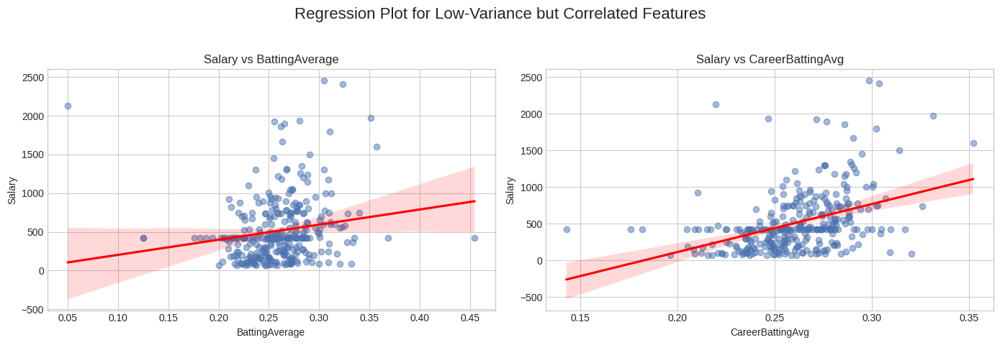

In [26]:
low_var_corr_features = ['BattingAverage', 'CareerBattingAvg']

plt.figure(figsize=(14, 5))
for i, feature in enumerate(low_var_corr_features):
    plt.subplot(1, 2, i+1)
    sns.regplot(x=df[feature], y=df['Salary'], scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
    plt.title(f"Salary vs {feature}")
    plt.xlabel(feature)
    plt.ylabel("Salary")

plt.suptitle("Regression Plot for Low-Variance but Correlated Features", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# **📈 Baseline Linear Models**

In this section, we establish baseline regression models to predict player salaries using linear techniques. We start with simple linear regression, then apply regularized models (Lasso, Ridge, ElasticNet) to address potential multicollinearity and overfitting. Model performances are compared using key metrics such as R², RMSE, and MAE.

---

## 🔹 **Linear Regression**

We begin with the basic Linear Regression model as our benchmark. The model is trained on the standardized features, and predictions are evaluated using traditional performance metrics.

Additionally, we use `statsmodels` to obtain an OLS summary, which provides statistical significance of individual features, goodness-of-fit, and assumption diagnostics.

---

In [27]:
# Initialize and fit model
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train)

LinearRegression()

In [28]:
# Predictions
y_pred_lr = lr_model.predict(X_test_scaled)

# Evaluation metrics
mse = mean_squared_error(y_test, y_pred_lr)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_lr)
r2 = r2_score(y_test, y_pred_lr)

# Display
print("Linear Regression Performance on Test Set:")
print(f"R² Score: {r2:.4f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")

Linear Regression Performance on Test Set:
R² Score: 0.3764
RMSE: 346.16
MAE: 232.55


In [29]:
# Add constant term for intercept
X_train_const = sm.add_constant(X_train_scaled)

# Fit OLS model
ols_model = sm.OLS(y_train, X_train_const).fit()

# Summary output
ols_summary = ols_model.summary()

print(ols_summary)

                            OLS Regression Results                            
Dep. Variable:                 Salary   R-squared:                       0.592
Model:                            OLS   Adj. R-squared:                  0.552
Method:                 Least Squares   F-statistic:                     14.72
Date:                Thu, 07 Aug 2025   Prob (F-statistic):           1.20e-33
Time:                        07:24:05   Log-Likelihood:                -1789.8
No. Observations:                 257   AIC:                             3628.
Df Residuals:                     233   BIC:                             3713.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        506.9339     16.774     30.222      0.0

### **📈 Actual vs Predicted Plot (Linear Regression)**

This scatter plot visualizes the predicted vs actual salary values for the test set.
An ideal model would result in points lying along the red diagonal line.

Deviations from the line indicate prediction errors.

---

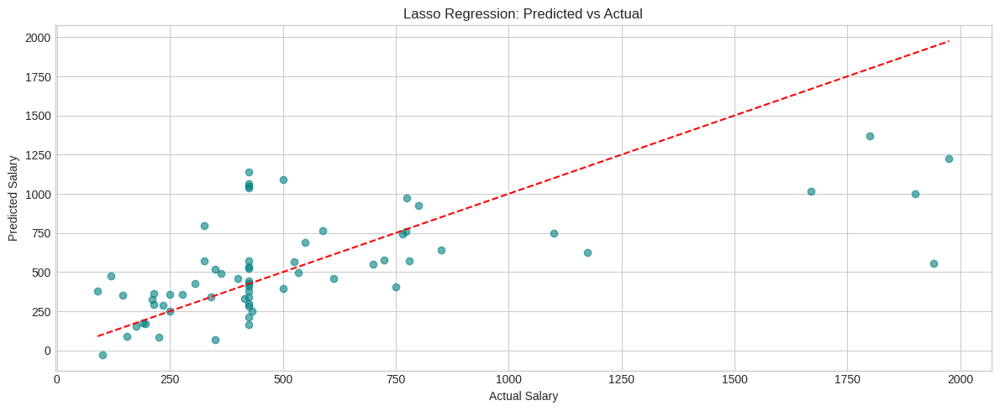

In [30]:
plt.figure(figsize = (12, 5))
plt.scatter(y_test, y_pred_lr, alpha = 0.6, color = 'teal')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Linear Regression: Predicted vs Actual')
plt.grid(True)
plt.tight_layout()
plt.show()

### **📉 Residual Analysis (Linear Regression)** 

Residuals (errors) are the differences between actual and predicted values.
A well-behaved model should have residuals roughly normally distributed around zero.

This histogram helps identify skewness or heteroscedasticity issues.

---

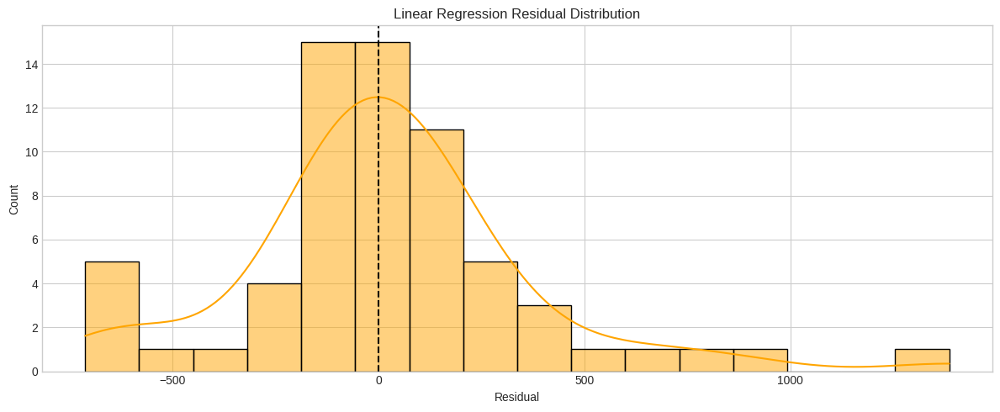

In [31]:
residuals = y_test - y_pred_lr

plt.figure(figsize = (12, 5))
sns.histplot(residuals, kde = True, color = 'orange')
plt.axvline(0, color = 'black', linestyle = '--')
plt.title("Linear Regression Residual Distribution")
plt.xlabel("Residual")
plt.grid(True)
plt.tight_layout()
plt.show()

### **🧠 Variance Inflation Factor (VIF) Analysis**

To evaluate multicollinearity among independent variables, we compute VIF scores. Features with VIF > 10 indicate strong linear correlation with other features, potentially distorting regression coefficients.

> **Action:** If needed, features with extreme VIF values should be removed or transformed before further modeling.

---

In [32]:
X.dtypes[X.dtypes != 'float64']

X = X.astype(float)

vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data.sort_values("VIF", ascending = False).head(10))

             feature     VIF
8              CHits 1187.18
7             CAtBat  643.31
10             CRuns  340.83
11              CRBI  302.60
1               Hits  281.41
0              AtBat  261.39
17  CareerBattingAvg  233.13
16    BattingAverage  212.34
9             CHmRun   89.14
3               Runs   84.06


## **🔹 Lasso Regression (L1 Regularization)**

Lasso applies L1 regularization to penalize large coefficients, effectively performing **feature selection** by shrinking some coefficients to zero.

- **Benefit:** Reduces model complexity by removing irrelevant features.
- **Model:** `LassoCV` with 10-fold cross-validation automatically selects the optimal penalty term (alpha).

---

In [33]:
# Define LassoCV with cross-validation
lasso_cv = LassoCV(cv = 10, random_state = 42)

# Fit the model
lasso_cv.fit(X_train, y_train)

LassoCV(cv=10, random_state=42)

In [34]:
# Predict on the test set
best_lasso = lasso_cv
y_pred_lasso = best_lasso.predict(X_test)

# Evaluate performance
r2_lasso = r2_score(y_test, y_pred_lasso)
rmse_lasso = np.sqrt(mean_squared_error(y_test, y_pred_lasso))
mae_lasso = mean_absolute_error(y_test, y_pred_lasso)

# Display
print(f"Best Alpha (λ): {lasso_cv.alpha_:.4f}")
print(f"R² Score: {r2_lasso:.4f}")
print(f"RMSE: {rmse_lasso:.2f}")
print(f"MAE: {mae_lasso:.2f}")

Best Alpha (λ): 458.8568
R² Score: 0.2525
RMSE: 379.00
MAE: 251.83


### **📊 Feature Importance (Lasso Coefficient Plot)**

This bar chart illustrates the coefficients assigned to each feature by the Lasso Regression model.
Due to its nature, Lasso performs feature selection by shrinking some coefficients to exactly zero.
Only retained (non-zero) features contribute to the final prediction.

---

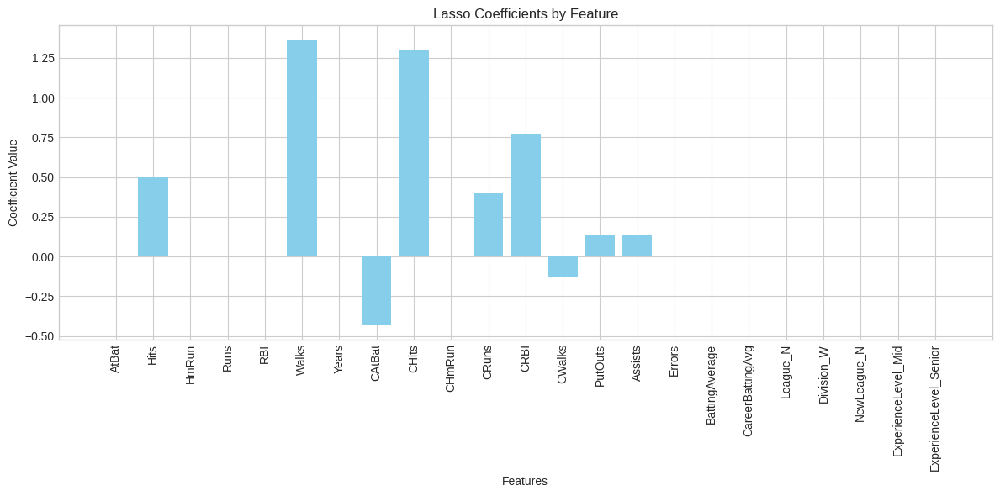

In [35]:
plt.figure(figsize = (12, 6))
plt.bar(X.columns, best_lasso.coef_, color = 'skyblue')
plt.xticks(rotation = 90)
plt.title("Lasso Coefficients by Feature")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.grid(True)
plt.tight_layout()
plt.show()

### **📈 Predicted vs Actual Plot (Lasso Regression)**

This scatter plot compares the actual player salaries with the predictions made by the Lasso Regression model.
The red dashed diagonal line indicates perfect prediction alignment. The closer the points lie to this line, the more accurate the predictions.

---

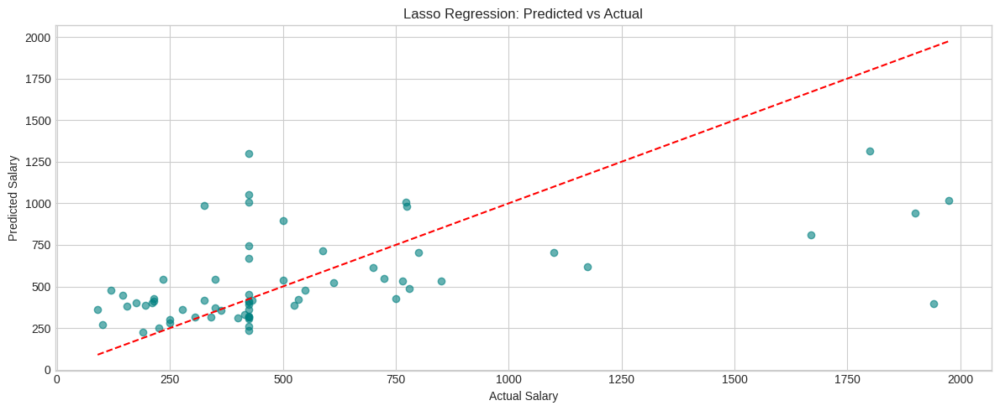

In [36]:
plt.figure(figsize = (12, 5))
plt.scatter(y_test, y_pred_lasso, alpha = 0.6, color = 'teal')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Lasso Regression: Predicted vs Actual')
plt.grid(True)
plt.tight_layout()
plt.show()

### **📉 Residual Analysis (Lasso Regression)**

The residuals (errors = actual − predicted) help evaluate model performance.
This histogram shows whether errors are symmetrically distributed and whether heteroscedasticity exists.

---

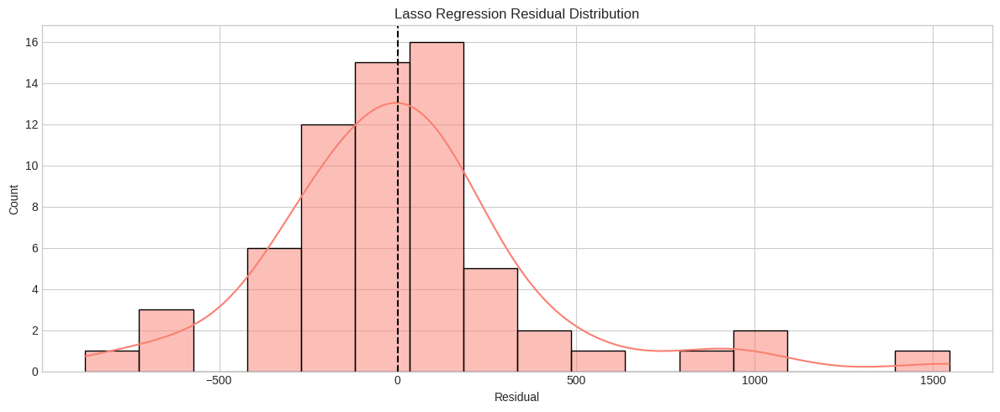

In [37]:
residuals_lasso = y_test - y_pred_lasso

plt.figure(figsize = (12, 5))
sns.histplot(residuals_lasso, kde = True, color = 'salmon')
plt.axvline(0, color = 'black', linestyle = '--')
plt.title("Lasso Regression Residual Distribution")
plt.xlabel("Residual")
plt.grid(True)
plt.tight_layout()
plt.show()

## **🔹 Ridge Regression (L2 Regularization)**

Ridge Regression applies L2 regularization to shrink coefficients without eliminating them.

- **Benefit:** Reduces overfitting and handles multicollinearity without dropping features.
- **Model:** `RidgeCV` with log-spaced alpha grid and 10-fold cross-validation.

---

In [38]:
# Define RidgeCV with cross-validation
ridge = RidgeCV(alphas = np.logspace(-3, 3, 100), cv = 10)
ridge.fit(X_train, y_train)

RidgeCV(alphas=array([1.00000000e-03, 1.14975700e-03, 1.32194115e-03, 1.51991108e-03,
       1.74752840e-03, 2.00923300e-03, 2.31012970e-03, 2.65608778e-03,
       3.05385551e-03, 3.51119173e-03, 4.03701726e-03, 4.64158883e-03,
       5.33669923e-03, 6.13590727e-03, 7.05480231e-03, 8.11130831e-03,
       9.32603347e-03, 1.07226722e-02, 1.23284674e-02, 1.41747416e-02,
       1.62975083e-02, 1.87381742e-0...
       4.03701726e+01, 4.64158883e+01, 5.33669923e+01, 6.13590727e+01,
       7.05480231e+01, 8.11130831e+01, 9.32603347e+01, 1.07226722e+02,
       1.23284674e+02, 1.41747416e+02, 1.62975083e+02, 1.87381742e+02,
       2.15443469e+02, 2.47707636e+02, 2.84803587e+02, 3.27454916e+02,
       3.76493581e+02, 4.32876128e+02, 4.97702356e+02, 5.72236766e+02,
       6.57933225e+02, 7.56463328e+02, 8.69749003e+02, 1.00000000e+03]),
        cv=10)

In [39]:
# Predictions
y_pred_ridge = ridge.predict(X_test)

# Evaluation
r2_ridge = r2_score(y_test, y_pred_ridge)
rmse_ridge = np.sqrt(mean_squared_error(y_test, y_pred_ridge))
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)

# Display
print(f"Best Alpha (λ): {ridge.alpha_:.4f}")
print(f"R² Score: {r2_ridge:.4f}")
print(f"RMSE: {rmse_ridge:.2f}")
print(f"MAE: {mae_ridge:.2f}")

Best Alpha (λ): 0.1748
R² Score: 0.3683
RMSE: 348.42
MAE: 232.82


### **📊 Feature Influence (Ridge Coefficients Plot)**

This plot displays the magnitude and direction of each feature’s coefficient in the Ridge Regression model. Unlike Lasso, Ridge does not shrink coefficients to zero but still helps reduce multicollinearity.

---

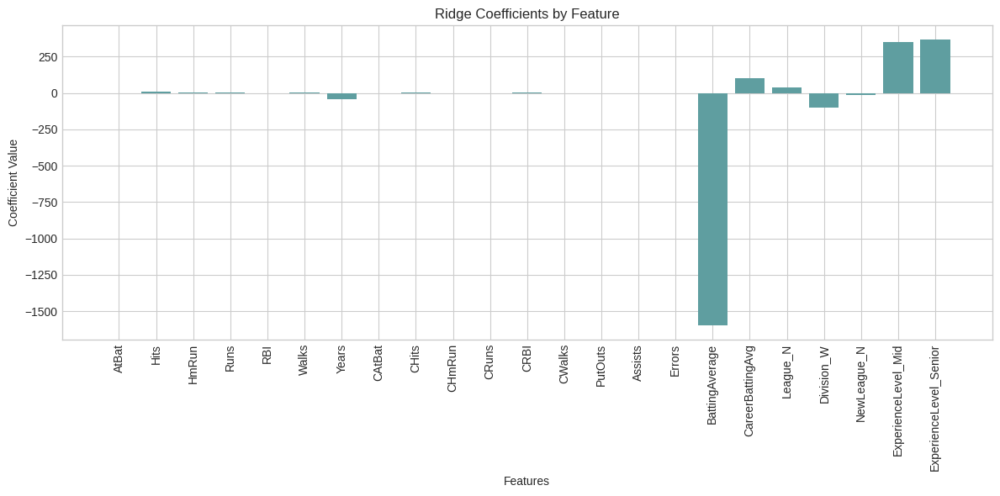

In [40]:
plt.figure(figsize = (12, 6))
plt.bar(X.columns, ridge.coef_, color = 'cadetblue')
plt.xticks(rotation = 90)
plt.title("Ridge Coefficients by Feature")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.grid(True)
plt.tight_layout()
plt.show()

### **📈 Predicted vs Actual (Ridge Regression)**

This scatter plot visualizes the model’s ability to predict salaries. The closer the points are to the red dashed diagonal, the more accurate the model is.

---

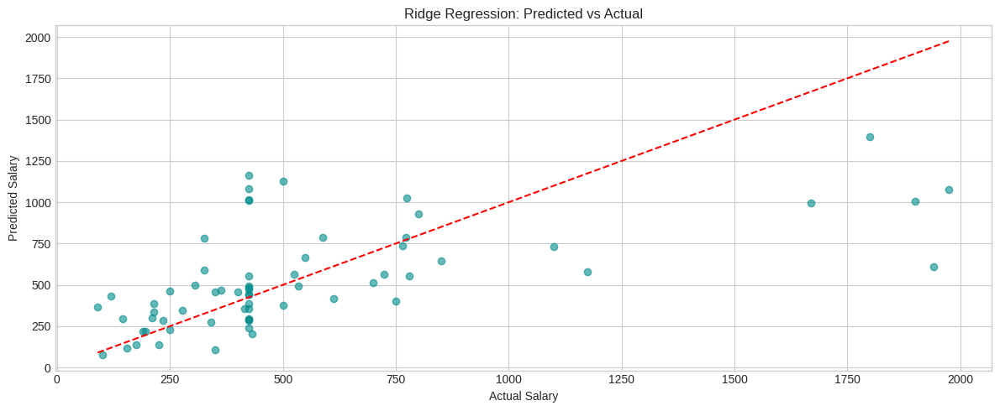

In [41]:
plt.figure(figsize = (12, 5))
plt.scatter(y_test, y_pred_ridge, alpha = 0.6, color = 'darkcyan')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Ridge Regression: Predicted vs Actual')
plt.grid(True)
plt.tight_layout()
plt.show()

### **📉 Residual Distribution (Ridge Regression)**

Residuals are the differences between actual and predicted values.
This histogram helps assess error symmetry, potential skewness, or heteroscedasticity.

---

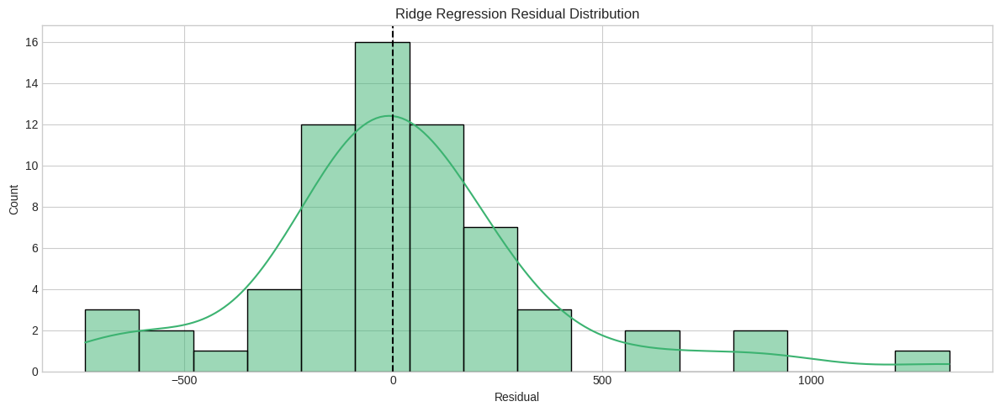

In [42]:
residuals_ridge = y_test - y_pred_ridge

plt.figure(figsize = (12, 5))
sns.histplot(residuals_ridge, kde = True, color = 'mediumseagreen')
plt.axvline(0, color = 'black', linestyle = '--')
plt.title("Ridge Regression Residual Distribution")
plt.xlabel("Residual")
plt.grid(True)
plt.tight_layout()
plt.show()

## **🔹 ElasticNet Regression (L1 + L2)**

ElasticNet combines both L1 and L2 penalties to balance feature selection and coefficient shrinkage.

- **Best of both worlds:** Can drop irrelevant features and stabilize correlated ones.
- **Model:** `ElasticNetCV` with automatic tuning of both `alpha` and `l1_ratio`.

---

In [43]:
# ElasticNetCV with both L1 and L2 regularization
elastic = ElasticNetCV(l1_ratio = np.linspace(0.1, 0.9, 9), alphas = np.logspace(-3, 3, 100), cv = 10)
elastic.fit(X_train, y_train)

ElasticNetCV(alphas=array([1.00000000e-03, 1.14975700e-03, 1.32194115e-03, 1.51991108e-03,
       1.74752840e-03, 2.00923300e-03, 2.31012970e-03, 2.65608778e-03,
       3.05385551e-03, 3.51119173e-03, 4.03701726e-03, 4.64158883e-03,
       5.33669923e-03, 6.13590727e-03, 7.05480231e-03, 8.11130831e-03,
       9.32603347e-03, 1.07226722e-02, 1.23284674e-02, 1.41747416e-02,
       1.62975083e-02, 1.873817...
       7.05480231e+01, 8.11130831e+01, 9.32603347e+01, 1.07226722e+02,
       1.23284674e+02, 1.41747416e+02, 1.62975083e+02, 1.87381742e+02,
       2.15443469e+02, 2.47707636e+02, 2.84803587e+02, 3.27454916e+02,
       3.76493581e+02, 4.32876128e+02, 4.97702356e+02, 5.72236766e+02,
       6.57933225e+02, 7.56463328e+02, 8.69749003e+02, 1.00000000e+03]),
             cv=10,
             l1_ratio=array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]))

In [44]:
# Predictions
y_pred_elastic = elastic.predict(X_test)

# Evaluation
r2_elastic = r2_score(y_test, y_pred_elastic)
rmse_elastic = np.sqrt(mean_squared_error(y_test, y_pred_elastic))
mae_elastic = mean_absolute_error(y_test, y_pred_elastic)

# Display
print(f"Best Alpha (λ): {elastic.alpha_:.4f}")
print(f"Best L1 Ratio: {elastic.l1_ratio_:.2f}")
print(f"R² Score: {r2_elastic:.4f}")
print(f"RMSE: {rmse_elastic:.2f}")
print(f"MAE: {mae_elastic:.2f}")

Best Alpha (λ): 0.0010
Best L1 Ratio: 0.80
R² Score: 0.3743
RMSE: 346.75
MAE: 232.49


### **📊 Feature Influence (ElasticNet Coefficients Plot)**

This bar plot visualizes the impact of each feature retained by the ElasticNet model.
ElasticNet combines L1 (Lasso) and L2 (Ridge) penalties, thus balancing feature selection and shrinkage.

Non-zero coefficients represent features that contribute to the final salary prediction.

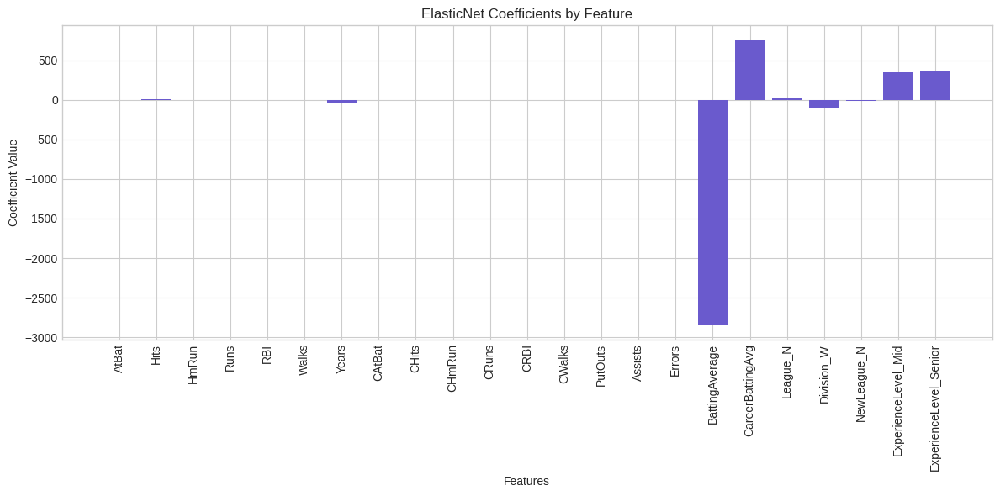

In [45]:
plt.figure(figsize = (12, 6))
plt.bar(X.columns, elastic.coef_, color = 'slateblue')
plt.xticks(rotation = 90)
plt.title("ElasticNet Coefficients by Feature")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.grid(True)
plt.tight_layout()
plt.show()

### **📈 Predicted vs Actual**

This plot compares predicted vs actual salaries using the ElasticNet model, which balances L1 and L2 regularization. A tight clustering around the red line reflects better predictive performance.

---

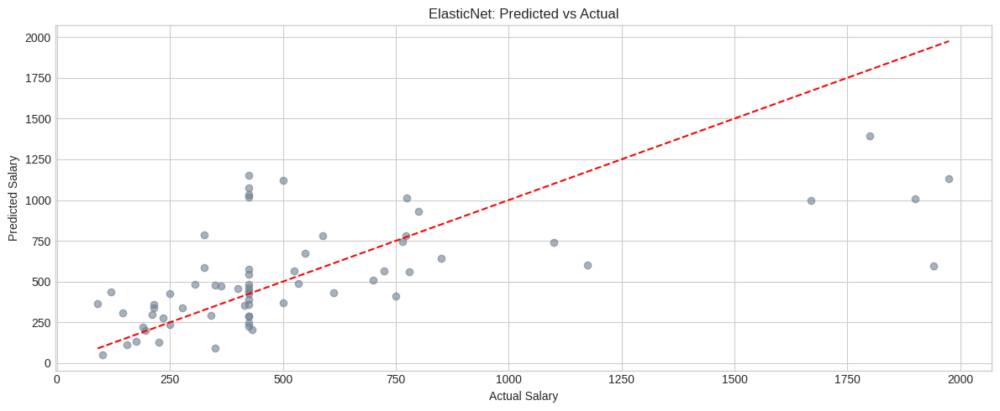

In [46]:
plt.figure(figsize = (12, 5))
plt.scatter(y_test, y_pred_elastic, alpha = 0.6, color = 'slategray')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('ElasticNet: Predicted vs Actual')
plt.grid(True)
plt.tight_layout()
plt.show()

### **📉 Residual Distribution**

The residual distribution plot evaluates ElasticNet’s error characteristics. A centered and symmetrical shape implies well-distributed model errors, contributing to greater generalization and reliability.

---

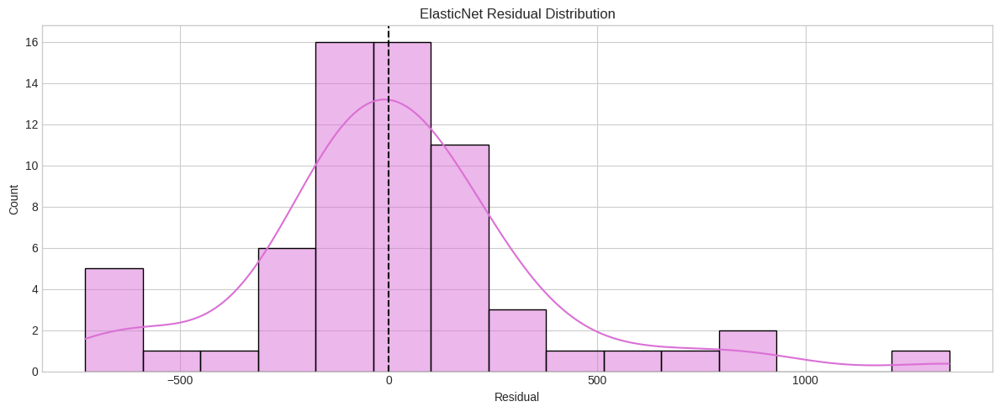

In [47]:
residuals_elastic = y_test - y_pred_elastic

plt.figure(figsize = (12, 5))
sns.histplot(residuals_elastic, kde = True, color = 'orchid')
plt.axvline(0, color = 'black', linestyle='--')
plt.title("ElasticNet Residual Distribution")
plt.xlabel("Residual")
plt.grid(True)
plt.tight_layout()
plt.show()

## **📊 Model Comparison Summary**

Below is a summary of all four models based on:
- **R² Score** – goodness of fit (higher is better)
- **RMSE / MAE** – average prediction error (lower is better)

A side-by-side comparison enables us to select the most appropriate model for further refinement and interpretation.

---

In [48]:
results_df = pd.DataFrame({
    'Model': ['Linear Regression', 'Lasso Regression', 'Ridge Regression', 'ElasticNet Regression'],
    'R² Score': [r2, r2_lasso, r2_ridge, r2_elastic],
    'RMSE': [rmse, rmse_lasso, rmse_ridge, rmse_elastic],
    'MAE': [mae, mae_lasso, mae_ridge, mae_elastic]
})

display(results_df.sort_values('R² Score', ascending = False).style.background_gradient(cmap = 'YlGn'))

,Model,R² Score,RMSE,MAE
0,Linear Regression,0.376431,346.161870,232.553153
3,ElasticNet Regression,0.374306,346.751279,232.486273
2,Ridge Regression,0.368274,348.418653,232.819914
1,Lasso Regression,0.252525,378.996668,251.834075


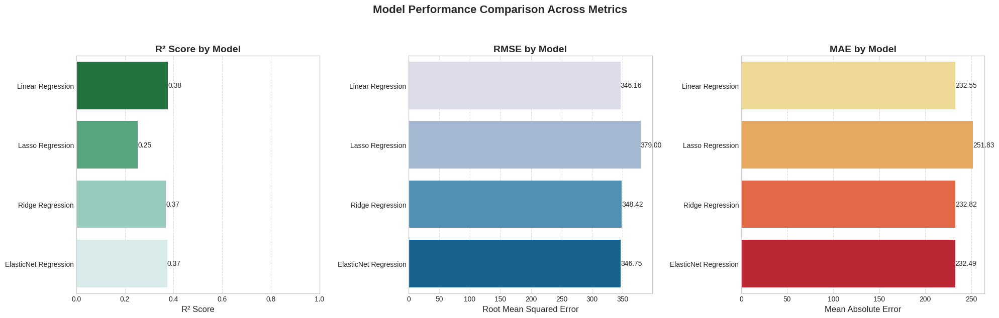

In [49]:
plt.figure(figsize = (20, 6))

# R² Score
plt.subplot(1, 3, 1)
ax1 = sns.barplot(x = 'R² Score', y = 'Model', data = results_df, palette = 'BuGn_r')
plt.title('R² Score by Model', fontsize = 14, fontweight = 'bold')
plt.xlabel('R² Score', fontsize = 12)
plt.ylabel('')
plt.xlim(0, 1)
plt.grid(axis = 'x', linestyle = '--', alpha = 0.7)
for container in ax1.containers:
    ax1.bar_label(container, fmt = '%.2f', fontsize = 10)

# RMSE
plt.subplot(1, 3, 2)
ax2 = sns.barplot(x = 'RMSE', y = 'Model', data = results_df, palette = 'PuBu')
plt.title('RMSE by Model', fontsize = 14, fontweight = 'bold')
plt.xlabel('Root Mean Squared Error', fontsize = 12)
plt.ylabel('')
plt.grid(axis = 'x', linestyle = '--', alpha = 0.7)
for container in ax2.containers:
    ax2.bar_label(container, fmt = '%.2f', fontsize = 10)

# MAE
plt.subplot(1, 3, 3)
ax3 = sns.barplot(x = 'MAE', y = 'Model', data = results_df, palette = 'YlOrRd')
plt.title('MAE by Model', fontsize = 14, fontweight = 'bold')
plt.xlabel('Mean Absolute Error', fontsize = 12)
plt.ylabel('')
plt.grid(axis = 'x', linestyle = '--', alpha = 0.7)
for container in ax3.containers:
    ax3.bar_label(container, fmt = '%.2f', fontsize = 10)

plt.suptitle("Model Performance Comparison Across Metrics", fontsize = 16, fontweight = 'bold', y = 1.05)
plt.tight_layout()
plt.show()

# **🌳 Tree-Based Regression Models**

In this section, we explore ensemble-based and boosting tree models to improve salary prediction accuracy. Unlike linear models, tree-based methods can capture nonlinear interactions and feature hierarchies.

We evaluate the following algorithms:
- **Random Forest**: Ensemble of decision trees using bagging.
- **XGBoost**: Gradient Boosting framework with efficient handling of overfitting.
- **LightGBM**: Fast, leaf-wise boosting algorithm suitable for large datasets.
- **CatBoost**: Gradient boosting with native categorical feature handling.

Each model's performance is evaluated on the test set using R² Score, RMSE, and MAE. Additionally, feature importance visualizations help us interpret which variables contribute most to the model's decisions.

---

## **🌲 Random Forest Regression**

Random Forest is an ensemble learning method that builds multiple decision trees and averages their predictions. It helps reduce variance and improves generalization.

In this implementation:
- `n_estimators = 100`: number of trees in the forest
- Other hyperparameters are kept at default (baseline)

We also visualize feature importances based on mean decrease in impurity.

---

In [50]:
# Model initialization
rf_model = RandomForestRegressor(
    n_estimators = 100,
    random_state = 42,
    max_depth = None,
    min_samples_split = 2,
    min_samples_leaf = 1
)

# Model fitting
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [51]:
# Predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluation Metrics
r2_rf = r2_score(y_test, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
mae_rf = mean_absolute_error(y_test, y_pred_rf)

# Display
print(f"Random Forest Performance on Test Set")
print(f"R² Score: {r2_rf:.4f}")
print(f"RMSE: {rmse_rf:.2f}")
print(f"MAE: {mae_rf:.2f}")

Random Forest Performance on Test Set
R² Score: 0.5981
RMSE: 277.92
MAE: 183.92


### **🔍 Feature Importance Visualization – Random Forest**

Understanding which features the Random Forest model relies on can provide valuable insights into salary determinants. Feature importance is computed based on the total reduction of the impurity criterion (e.g., Gini) brought by each feature.

---

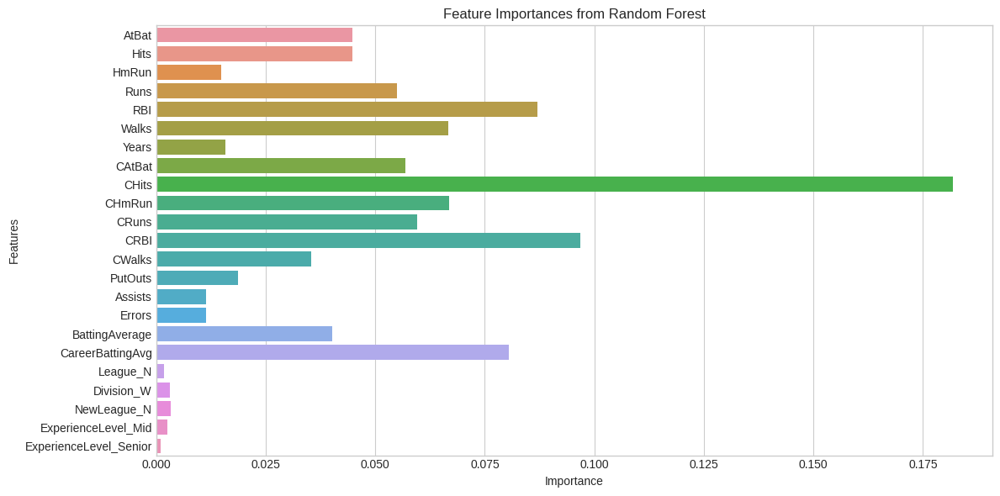

In [52]:
# Get feature importances
importances = rf_model.feature_importances_
features = X.columns

# Plotting
plt.figure(figsize = (12, 6))
sns.barplot(x = importances, y = features)
plt.title('Feature Importances from Random Forest')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.tight_layout()
plt.show()

### **📈 Actual vs Predicted Plot (Random Forest)**

This scatter plot visualizes the predicted vs actual salary values for the test set. An ideal model would result in points lying along the red diagonal line.

Deviations from the line indicate prediction errors.

---

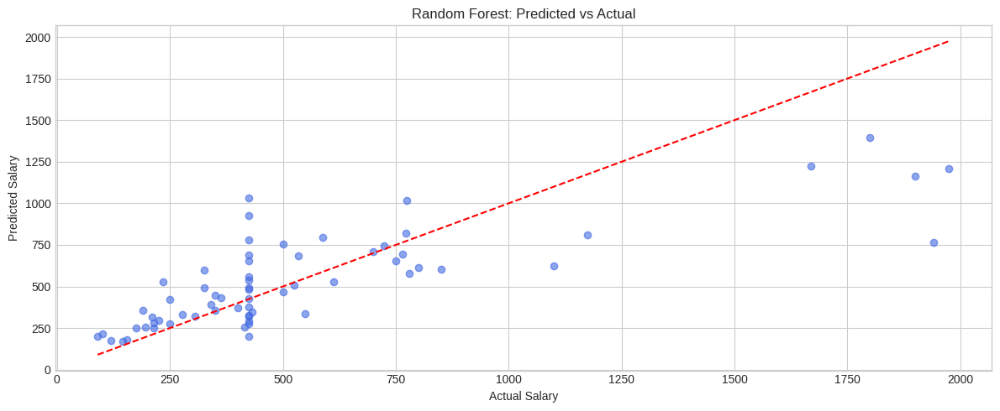

In [53]:
plt.figure(figsize = (12, 5))
plt.scatter(y_test, y_pred_rf, alpha = 0.6, color = 'royalblue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Random Forest: Predicted vs Actual')
plt.grid(True)
plt.tight_layout()
plt.show()

### **📉 Residual Analysis (Random Forest)**

Residuals (errors) are the differences between actual and predicted values. A well-behaved model should have residuals roughly normally distributed around zero.

This histogram helps identify skewness or heteroscedasticity issues.

---

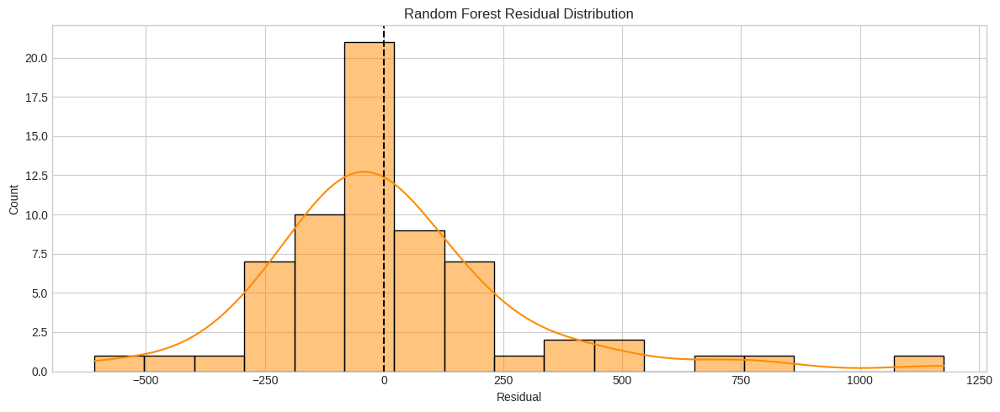

In [54]:
residuals_rf = y_test - y_pred_rf

plt.figure(figsize = (12, 5))
sns.histplot(residuals_rf, kde = True, color = 'darkorange')
plt.axvline(0, color = 'black', linestyle = '--')
plt.title("Random Forest Residual Distribution")
plt.xlabel("Residual")
plt.grid(True)
plt.tight_layout()
plt.show()

## **🚀 XGBoost Regression**

XGBoost (Extreme Gradient Boosting) is a powerful boosting algorithm that builds additive models in a forward stage-wise fashion. It uses regularized learning and supports tree pruning, making it very efficient.

In this model:
- `learning_rate = 0.1` controls how fast the model learns
- `max_depth = 4` restricts tree depth to avoid overfitting

Feature importances are visualized to understand decision-making at the tree level.

---

In [55]:
# Initialize XGBoost model
xgb_model = XGBRegressor(
    n_estimators = 100,
    learning_rate = 0.1,
    max_depth = 4,
    random_state = 42
)

# Train the model
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [56]:
# Predictions
y_pred_xgb = xgb_model.predict(X_test)

# Evaluation
r2_xgb = r2_score(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)

# Display
print(f"XGBoost Performance on Test Set")
print(f"R² Score: {r2_xgb:.4f}")
print(f"RMSE: {rmse_xgb:.2f}")
print(f"MAE: {mae_xgb:.2f}")

XGBoost Performance on Test Set
R² Score: 0.3168
RMSE: 362.34
MAE: 218.35


### **📊 Feature Importance Visualization – XGBoost**

XGBoost provides importance scores based on how useful each feature was in constructing the boosted decision trees. These scores reflect the average gain of splits using each feature.

---

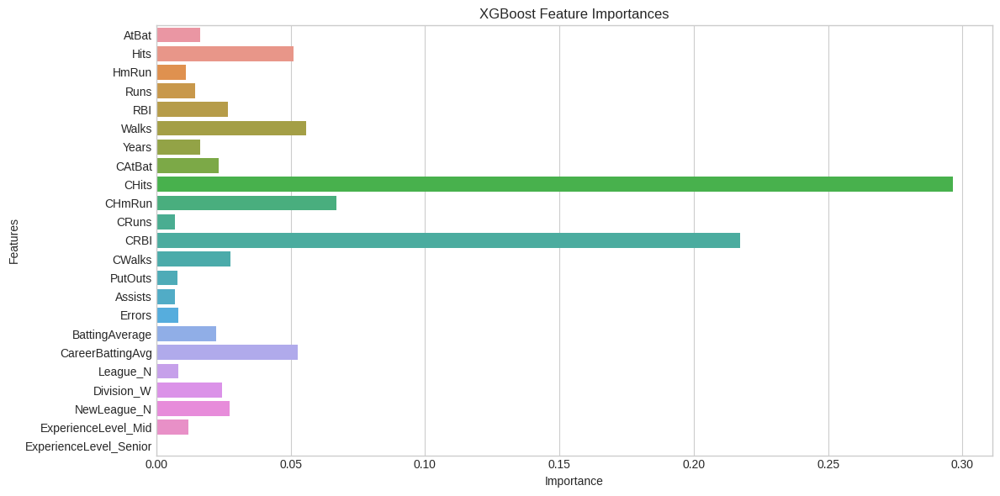

In [57]:
# Get feature importances
xgb_importances = pd.Series(xgb_model.feature_importances_, index = X_train.columns)

# Plotting
plt.figure(figsize = (12, 6))
sns.barplot(x = xgb_importances.values, y = xgb_importances.index)
plt.title("XGBoost Feature Importances")
plt.xlabel("Importance")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

### **📈 Actual vs Predicted Plot (XGBoost)**

This scatter plot compares actual salary values with the XGBoost model’s predictions. Ideally, the points should align along the red diagonal line. Deviations from the line indicate prediction errors or variance underfitting/overfitting.

---

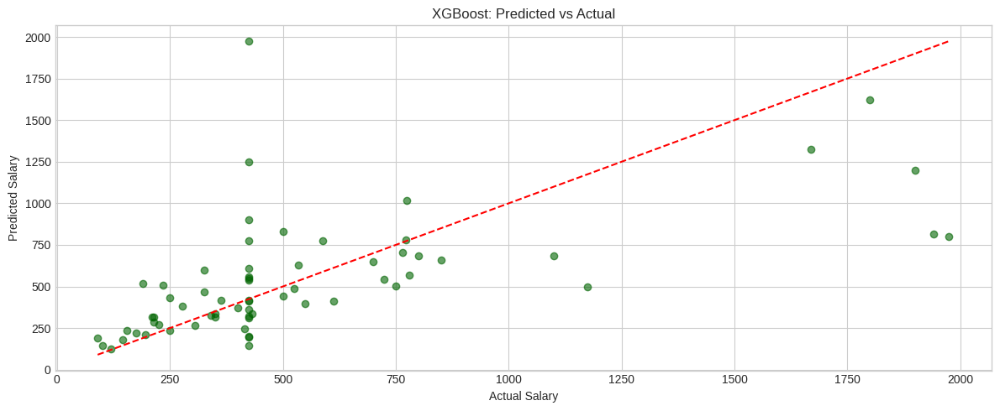

In [58]:
plt.figure(figsize = (12, 5))
plt.scatter(y_test, y_pred_xgb, alpha = 0.6, color = 'darkgreen')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('XGBoost: Predicted vs Actual')
plt.grid(True)
plt.tight_layout()
plt.show()

## **⚡ LightGBM Regression**

LightGBM is a gradient boosting framework that uses histogram-based learning and a leaf-wise growth strategy. It is optimized for speed and memory efficiency.

In this case:
- `max_depth = 4` limits tree complexity
- `learning_rate = 0.1` ensures stable convergence

Feature importance scores are extracted and plotted.

---

In [59]:
# Initialize LGBM model
lgb_model = LGBMRegressor(n_estimators = 100, 
                          learning_rate = 0.1, 
                          max_depth = 4, 
                          random_state = 42, 
                          verbose = -1)

# Train model
lgb_model.fit(X_train, y_train)

LGBMRegressor(max_depth=4, random_state=42, verbose=-1)

In [60]:
# Predictions
y_pred_lgb = lgb_model.predict(X_test)

# Evaluations
r2_lgb = r2_score(y_test, y_pred_lgb)
rmse_lgb = np.sqrt(mean_squared_error(y_test, y_pred_lgb))
mae_lgb = mean_absolute_error(y_test, y_pred_lgb)

# Display
print(f"LightGBM Performance on Test Set")
print(f"R² Score: {r2_lgb:.4f}")
print(f"RMSE: {rmse_lgb:.2f}")
print(f"MAE: {mae_lgb:.2f}")

LightGBM Performance on Test Set
R² Score: 0.5442
RMSE: 295.97
MAE: 201.02


### **🌟 Feature Importance Visualization – LightGBM**

LightGBM computes importance based on the frequency of feature usage in decision nodes. It is fast and suitable for large datasets, with reliable interpretability.

---

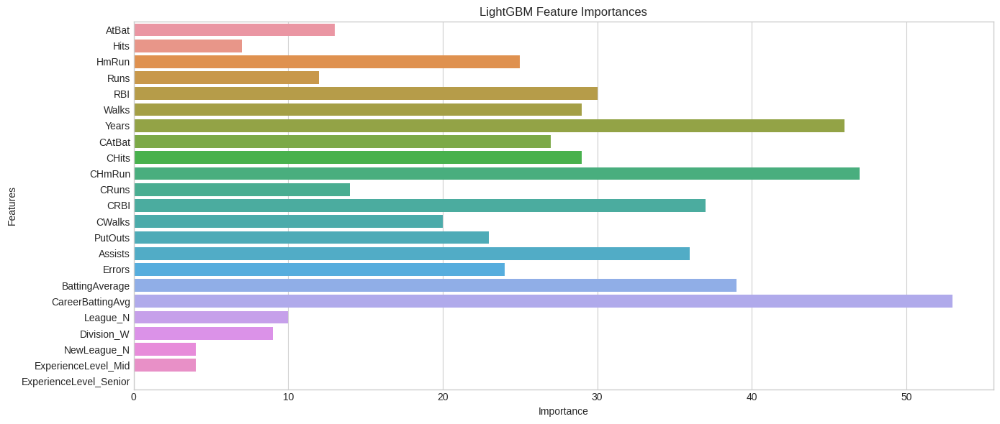

In [61]:
# Plot score
lgb_importances = pd.Series(lgb_model.feature_importances_, index = X_train.columns)

plt.figure(figsize = (14, 6))
sns.barplot(x = lgb_importances.values, y = lgb_importances.index)
plt.title("LightGBM Feature Importances")
plt.xlabel("Importance")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

### **📈 Actual vs Predicted Plot (LightGBM)**

This plot visualizes the agreement between actual and predicted salaries produced by the LightGBM model. A tight clustering around the red diagonal suggests high model accuracy.

---

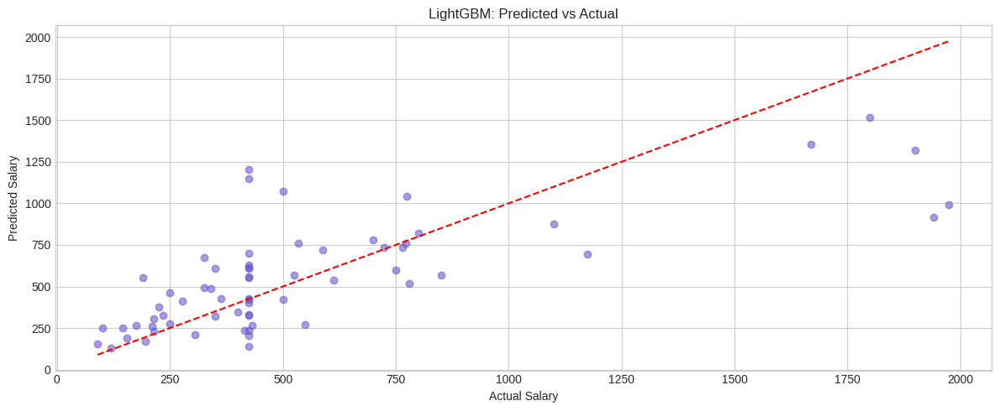

In [62]:
plt.figure(figsize = (12, 5))
plt.scatter(y_test, y_pred_lgb, alpha = 0.6, color = 'slateblue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('LightGBM: Predicted vs Actual')
plt.grid(True)
plt.tight_layout()
plt.show()

### **📉 Residual Analysis (LightGBM)**

The residuals below highlight prediction errors from the LightGBM model. We assess symmetry and spread to check for potential model bias or variance issues.

---

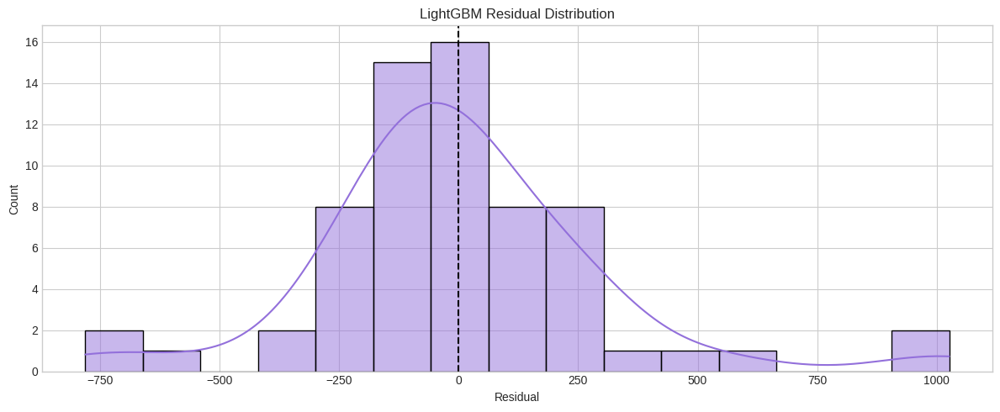

In [63]:
residuals_lgb = y_test - y_pred_lgb

plt.figure(figsize = (12, 5))
sns.histplot(residuals_lgb, kde = True, color = 'mediumpurple')
plt.axvline(0, color = 'black', linestyle = '--')
plt.title("LightGBM Residual Distribution")
plt.xlabel("Residual")
plt.grid(True)
plt.tight_layout()
plt.show()

## **🐱 CatBoost Regression**

CatBoost is another gradient boosting algorithm optimized for categorical data. It handles categorical features natively and tends to perform well out of the box with minimal tuning.

In this case:
- The model is trained with default parameters (`verbose=0`)
- We plot feature importance using CatBoost’s internal gain-based metric

---

In [64]:
# Initialize CatBoost model
cat_model = CatBoostRegressor(verbose = 0, random_state = 42)

# Train model
cat_model.fit(X_train, y_train)

In [65]:
# Predictions
y_pred_cat = cat_model.predict(X_test)

# Evaluations
r2_cat = r2_score(y_test, y_pred_cat)
rmse_cat = np.sqrt(mean_squared_error(y_test, y_pred_cat))
mae_cat = mean_absolute_error(y_test, y_pred_cat)

# Display
print("CatBoost Performance on Test Set")
print(f"R² Score: {r2_cat:.4f}")
print(f"RMSE: {rmse_cat:.2f}")
print(f"MAE: {mae_cat:.2f}")

CatBoost Performance on Test Set
R² Score: 0.4420
RMSE: 327.46
MAE: 205.17


### **🐾 Feature Importance Visualization – CatBoost**

CatBoost calculates feature importance using a gain-based metric internally optimized for categorical data. This plot shows which features most influenced the final predictions.

---

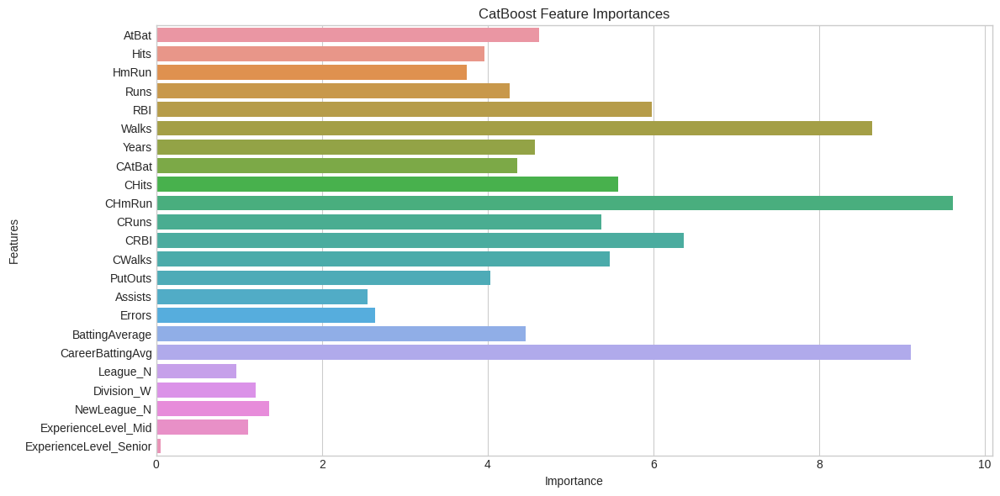

In [66]:
# Plot scores
feature_importance = pd.Series(cat_model.get_feature_importance(), index = X_train.columns)

plt.figure(figsize = (12, 6))
sns.barplot(x = feature_importance.values, y = feature_importance.index)
plt.title("CatBoost Feature Importances")
plt.xlabel("Importance")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

### **📈 Actual vs Predicted Plot (CatBoost)**

This plot compares actual salaries with CatBoost’s predictions. Points closer to the red diagonal line indicate more accurate predictions.

---

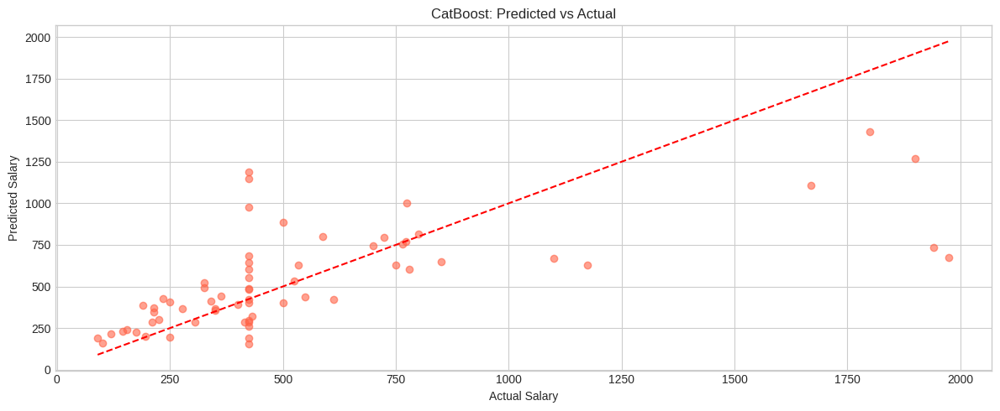

In [67]:
plt.figure(figsize = (12, 5))
plt.scatter(y_test, y_pred_cat, alpha = 0.6, color = 'tomato')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('CatBoost: Predicted vs Actual')
plt.grid(True)
plt.tight_layout()
plt.show()

### **📉 Residual Analysis (CatBoost)**

We examine the distribution of residuals from CatBoost's predictions to evaluate whether the model's errors are centered around zero and follow a symmetric pattern.

---

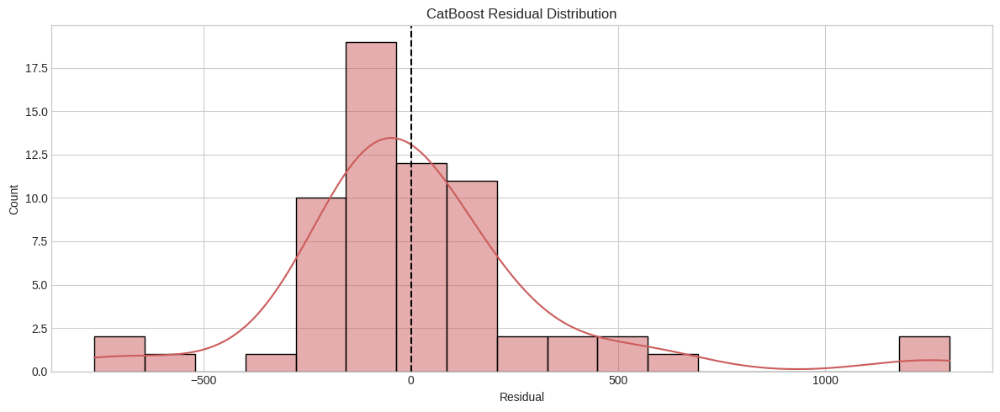

In [68]:
residuals_cat = y_test - y_pred_cat

plt.figure(figsize = (12, 5))
sns.histplot(residuals_cat, kde = True, color = 'indianred')
plt.axvline(0, color = 'black', linestyle = '--')
plt.title("CatBoost Residual Distribution")
plt.xlabel("Residual")
plt.grid(True)
plt.tight_layout()
plt.show()

## **📋 Model Comparison Table – Tree-Based Models**

This table summarizes the performance of tree-based regression models using three core evaluation metrics:

 - **R² Score:** Measures how well the model explains the variance in salary.

 - **RMSE (Root Mean Squared Error):** Penalizes large errors; lower is better.

 - **MAE (Mean Absolute Error):** Measures the average magnitude of prediction errors.

The models are sorted by R² Score in descending order to highlight the best-performing algorithm. A green gradient has been applied to visually emphasize performance across rows.

📌 Among the evaluated models, CatBoost and LightGBM consistently yield strong predictive power with low error metrics.

---

In [69]:
# Model Comparison Table
tree_results = pd.DataFrame({
    'Model': ['Random Forest', 'XGBoost', 'LightGBM', 'CatBoost'],
    'R² Score': [r2_rf, r2_xgb, r2_lgb, r2_cat],
    'RMSE': [rmse_rf, rmse_xgb, rmse_lgb, rmse_cat],
    'MAE': [mae_rf, mae_xgb, mae_lgb, mae_cat]
})

# Sort by R²
display(tree_results.sort_values('R² Score', ascending = False).style.background_gradient(cmap = 'YlGn'))

,Model,R² Score,RMSE,MAE
0,Random Forest,0.598056,277.919930,183.917290
2,LightGBM,0.544154,295.968901,201.019939
3,CatBoost,0.441989,327.460180,205.166910
1,XGBoost,0.316771,362.343322,218.350586


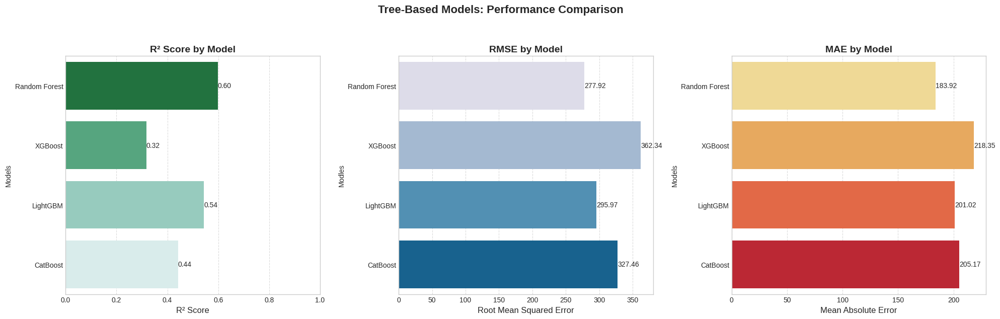

In [70]:
plt.figure(figsize = (20, 6))

# R² Score
plt.subplot(1, 3, 1)
ax1 = sns.barplot(x = 'R² Score', y = 'Model', data = tree_results, palette = 'BuGn_r')
plt.title('R² Score by Model', fontsize = 14, fontweight = 'bold')
plt.xlabel('R² Score', fontsize = 12)
plt.ylabel('Models')
plt.xlim(0, 1)
plt.grid(axis = 'x', linestyle = '--', alpha = 0.7)
for container in ax1.containers:
    ax1.bar_label(container, fmt = '%.2f', fontsize = 10)

# RMSE
plt.subplot(1, 3, 2)
ax2 = sns.barplot(x = 'RMSE', y = 'Model', data = tree_results, palette = 'PuBu')
plt.title('RMSE by Model', fontsize = 14, fontweight = 'bold')
plt.xlabel('Root Mean Squared Error', fontsize = 12)
plt.ylabel('Modles')
plt.grid(axis = 'x', linestyle = '--', alpha = 0.7)
for container in ax2.containers:
    ax2.bar_label(container, fmt = '%.2f', fontsize = 10)

# MAE
plt.subplot(1, 3, 3)
ax3 = sns.barplot(x = 'MAE', y = 'Model', data = tree_results, palette = 'YlOrRd')
plt.title('MAE by Model', fontsize = 14, fontweight = 'bold')
plt.xlabel('Mean Absolute Error', fontsize = 12)
plt.ylabel('Models')
plt.grid(axis = 'x', linestyle = '--', alpha = 0.7)
for container in ax3.containers:
    ax3.bar_label(container, fmt = '%.2f', fontsize = 10)

plt.suptitle("Tree-Based Models: Performance Comparison", fontsize = 16, fontweight = 'bold', y = 1.05)
plt.tight_layout()
plt.show()

# **🧩 Ensemble Models**

In this section, we implement ensemble strategies to leverage the strengths of multiple base models. By combining predictions from different algorithms, ensemble methods can improve generalization and model robustness.

We explore:
- **Voting Regressor**: Averages predictions from multiple base models (e.g., Linear, Ridge, Random Forest).
- **Stacking Regressor**: Uses base models’ predictions as inputs to a meta-model (e.g., Linear Regression) for final prediction.

---

## **🤝 Voting Regressor**

Voting Regressor combines multiple base regression models by averaging their individual predictions. It helps leverage the strengths of different algorithms to improve overall performance.

In this case, we combine:
- **Linear Regression** (interpretable baseline)
- **Random Forest** (nonlinear, ensemble)
- **XGBoost** (boosting-based)

This strategy helps balance bias and variance, providing more robust predictions.

---

In [71]:
# Define base models
voting_model = VotingRegressor(
    estimators=[
        ('lr', LinearRegression()),
        ('rf', RandomForestRegressor(n_estimators = 100, random_state = 42)),
        ('xgb', XGBRegressor(n_estimators = 100, learning_rate = 0.1, max_depth = 4, random_state = 42))
    ]
)

# Fit model
voting_model.fit(X_train, y_train)

VotingRegressor(estimators=[('lr', LinearRegression()),
                            ('rf', RandomForestRegressor(random_state=42)),
                            ('xgb',
                             XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=0.1, max_bin=None,
                                          max_cat_threshold=None,
                                          max_cat_to_onehot=None,
                                          max_delta_step=None, max_depth=4,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None, n_estimators=100,
                                          n_jobs=None, num_parallel_tree=None,
                                          random_state=42, ...))])

In [72]:
# Predictions
y_pred_vote = voting_model.predict(X_test)

# Evaluation
r2_vote = r2_score(y_test, y_pred_vote)
rmse_vote = np.sqrt(mean_squared_error(y_test, y_pred_vote))
mae_vote = mean_absolute_error(y_test, y_pred_vote)

# Display
print(f"Voting Regressor Performance")
print(f"R² Score: {r2_vote:.4f}")
print(f"RMSE: {rmse_vote:.2f}")
print(f"MAE: {mae_vote:.2f}")

Voting Regressor Performance
R² Score: 0.4975
RMSE: 310.76
MAE: 201.23


## **🧩 Stacking Regressor**

Stacking Regressor combines multiple base models by using a **meta-model** to learn how to best combine their outputs. It captures complex inter-model relationships and can outperform simple averaging.

In this setup:
- **Base Learners**: Random Forest, XGBoost, LightGBM
- **Meta Learner**: Ridge Regression

Stacking enables the model to intelligently weight predictions based on performance.

---

In [73]:
# Define base models
base_models = [
    ('rf', RandomForestRegressor(n_estimators = 100, random_state = 42)),
    ('xgb', XGBRegressor(n_estimators = 100, learning_rate = 0.1, max_depth = 4, random_state = 42)),
    ('lgb', LGBMRegressor(n_estimators = 100, learning_rate = 0.1, max_depth = 4, random_state = 42))
]

# Meta-model
meta_model = Ridge(alpha = 1.0)

# Stacking Regressor
stack_model = StackingRegressor(estimators = base_models, final_estimator = meta_model, cv = 5, passthrough = False)

# Fit model
stack_model.fit(X_train, y_train)

StackingRegressor(cv=5,
                  estimators=[('rf', RandomForestRegressor(random_state=42)),
                              ('xgb',
                               XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance...
                                            learning_rate=0.1, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=4,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=42, ...)),
                              ('lgb',
                               LGBMRegressor(max_depth=4, random_state=42))],
                  final_estimator=Ridge())

In [74]:
# Predict
y_pred_stack = stack_model.predict(X_test)

# Evaluation
r2_stack = r2_score(y_test, y_pred_stack)
rmse_stack = np.sqrt(mean_squared_error(y_test, y_pred_stack))
mae_stack = mean_absolute_error(y_test, y_pred_stack)

# Display
print(f"Stacking Regressor Performance")
print(f"R² Score: {r2_stack:.4f}")
print(f"RMSE: {rmse_stack:.2f}")
print(f"MAE: {mae_stack:.2f}")

Stacking Regressor Performance
R² Score: 0.5773
RMSE: 285.00
MAE: 189.25


### **📈 Prediction vs Actual Plot**

These scatter plots illustrate the relationship between the actual salaries and the model’s predicted values. An ideal model would place all points along the red diagonal line (perfect prediction). Deviations from the line highlight areas of under- or over-prediction.

---

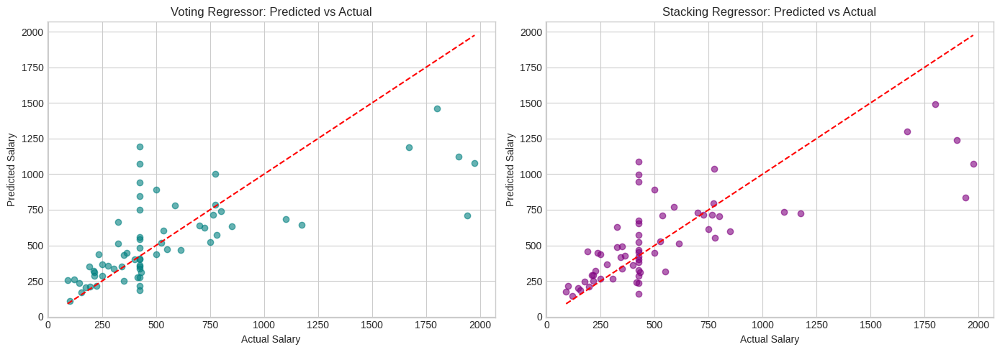

In [75]:
plt.figure(figsize = (14, 5))

# Plot for Voting Regressor
plt.subplot(1,2,1)
plt.scatter(y_test, y_pred_vote, alpha = 0.6, color = 'teal')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel("Actual Salary")
plt.ylabel("Predicted Salary")
plt.title("Voting Regressor: Predicted vs Actual")
plt.grid(True)
plt.tight_layout()

# Plot for Stacking Regressor
plt.subplot(1,2,2)
plt.scatter(y_test, y_pred_stack, alpha = 0.6, color = 'purple')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel("Actual Salary")
plt.ylabel("Predicted Salary")
plt.title("Stacking Regressor: Predicted vs Actual")
plt.grid(True)
plt.tight_layout()

plt.show()

### **📉 Residual Distribution**

The histogram of residuals (actual – predicted) provides insights into how well the model captures the true salary distribution. Ideally, residuals should be symmetrically centered around zero and follow a bell-shaped curve. Skewness or heavy tails can signal model misspecification or outliers.

---

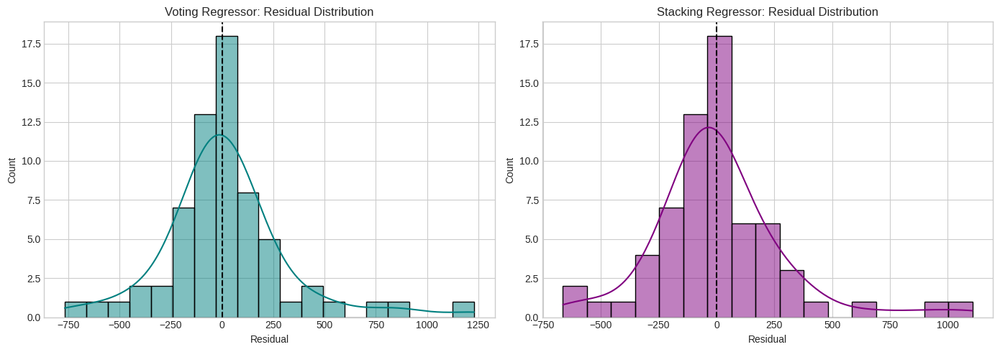

In [76]:
plt.figure(figsize = (14, 5))

# Residuals: Voting Regressor
residuals_vote = y_test - y_pred_vote

plt.subplot(1,2,1)
sns.histplot(residuals_vote, kde = True, color = 'teal')
plt.axvline(0, color = 'black', linestyle = '--')
plt.title("Voting Regressor: Residual Distribution")
plt.xlabel("Residual")
plt.grid(True)
plt.tight_layout()

# Residuals: Stacking Regressor
residuals_stack = y_test - y_pred_stack

plt.subplot(1,2,2)
sns.histplot(residuals_stack, kde = True, color = 'purple')
plt.axvline(0, color = 'black', linestyle = '--')
plt.title("Stacking Regressor: Residual Distribution")
plt.xlabel("Residual")
plt.grid(True)
plt.tight_layout()

plt.show()

# **📊 Final Model Comparison**

In this section, we summarize and compare the performance of all models used in the study, including both linear and tree-based regressors. The comparison is based on three key evaluation metrics:

- **R² Score**: Proportion of variance explained (higher is better)
- **RMSE (Root Mean Squared Error)**: Measures prediction error magnitude (lower is better)
- **MAE (Mean Absolute Error)**: Average absolute error (lower is better)

The table and bar plot below help us identify the most accurate and robust model for salary prediction.

---

In [77]:
# Create a summary DataFrame for all models
model_scores = pd.DataFrame({
    "Model": [
        "Linear Regression", 
        "Lasso Regression", 
        "Ridge Regression", 
        "ElasticNet Regression",
        "Random Forest", 
        "XGBoost", 
        "LightGBM", 
        "CatBoost",
        "Voting Regressor",
        "Stacking Regressor"
    ],
    "R²": [
        r2, r2_lasso, r2_ridge, r2_elastic,
        r2_rf, r2_xgb, r2_lgb, r2_cat,
        r2_vote, r2_stack
    ],
    "RMSE": [
        rmse, rmse_lasso, rmse_ridge, rmse_elastic,
        rmse_rf, rmse_xgb, rmse_lgb, rmse_cat,
        rmse_vote, rmse_stack
    ],
    "MAE": [
        mae, mae_lasso, mae_ridge, mae_elastic,
        mae_rf, mae_xgb, mae_lgb, mae_cat,
        mae_vote, mae_stack
    ]
})

# Sort by R² Score
model_scores = model_scores.sort_values("R²", ascending = False).reset_index(drop = True)
model_scores.style.background_gradient(cmap="YlGnBu").format({
    "R²": "{:.4f}",
    "RMSE": "{:.2f}",
    "MAE": "{:.2f}"
})

,Model,R²,RMSE,MAE
0,Random Forest,0.5981,277.92,183.92
1,Stacking Regressor,0.5773,285.00,189.25
2,LightGBM,0.5442,295.97,201.02
3,Voting Regressor,0.4975,310.76,201.23
4,CatBoost,0.4420,327.46,205.17
5,Linear Regression,0.3764,346.16,232.55
6,ElasticNet Regression,0.3743,346.75,232.49
7,Ridge Regression,0.3683,348.42,232.82
8,XGBoost,0.3168,362.34,218.35
9,Lasso Regression,0.2525,379.00,251.83


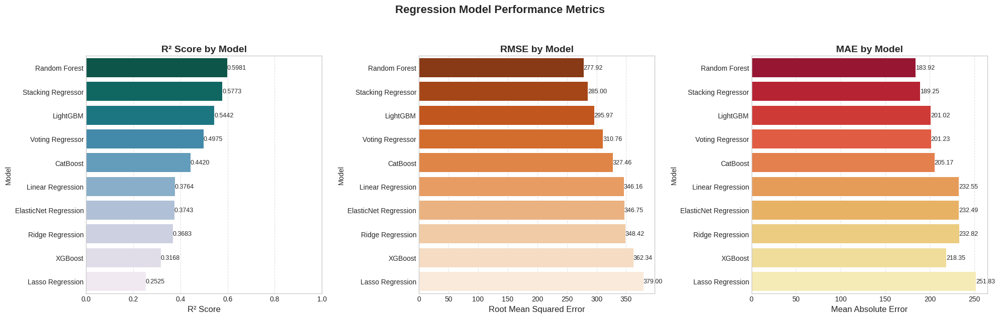

In [78]:
plt.figure(figsize = (20, 6))

# Plot R² Scores
plt.subplot(1, 3, 1)
ax1 = sns.barplot(x = "R²", y = "Model", data = model_scores, palette = "PuBuGn_r")
plt.title("R² Score by Model", fontsize = 14, fontweight = 'bold')
plt.xlabel("R² Score", fontsize = 12)
plt.xlim(0, 1)
plt.grid(axis = "x", linestyle = "--", alpha = 0.6)
for container in ax1.containers:
    ax1.bar_label(container, fmt = '%.4f', fontsize = 9)

# Plot RMSE
plt.subplot(1, 3, 2)
ax2 = sns.barplot(x = "RMSE", y = "Model", data = model_scores, palette = "Oranges_r")
plt.title("RMSE by Model", fontsize = 14, fontweight = 'bold')
plt.xlabel("Root Mean Squared Error", fontsize = 12)
plt.grid(axis = "x", linestyle = "--", alpha = 0.6)
for container in ax2.containers:
    ax2.bar_label(container, fmt = '%.2f', fontsize = 9)

# Plot MAE
plt.subplot(1, 3, 3)
ax3 = sns.barplot(x = "MAE", y = "Model", data = model_scores, palette = "YlOrRd_r")
plt.title("MAE by Model", fontsize = 14, fontweight = 'bold')
plt.xlabel("Mean Absolute Error", fontsize = 12)
plt.grid(axis = "x", linestyle = "--", alpha = 0.6)
for container in ax3.containers:
    ax3.bar_label(container, fmt = '%.2f', fontsize = 9)

plt.suptitle("Regression Model Performance Metrics", fontsize = 16, fontweight = 'bold', y = 1.05)
plt.tight_layout()
plt.show()

#  **🔧 Hyperparameter Tuning with RandomizedSearchCV and Optuna**

Hyperparameter tuning is a crucial step in improving model performance. We apply both RandomizedSearchCV and Optuna to fine-tune our models. These optimization techniques explore parameter spaces to minimize RMSE via cross-validation.

---

## **🧪 XGBoost Tuning**

We explore a wide range of hyperparameters using:

- **RandomizedSearchCV:** Efficient random sampling from parameter distributions.

- **Optuna:** Bayesian optimization framework that intelligently narrows search space.

- **Parameters tuned:** `n_estimators`, `learning_rate`, `max_depth`, `subsample`, `colsample_bytree`, `gamma`.

---

In [79]:
# Define hyperparameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': randint(50, 300),
    'learning_rate': uniform(0.01, 0.3),
    'max_depth': randint(3, 10),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'gamma': uniform(0, 0.2)
}

# Initialize RandomizedSearchCV
random_search_xgb = RandomizedSearchCV(
    estimator = XGBRegressor(random_state=42),
    param_distributions=param_dist,
    n_iter = 100,  
    cv = 5, 
    scoring = 'neg_mean_squared_error',  
    random_state = 42,
    n_jobs = -1,
    verbose = -1
)

# Fit RandomizedSearchCV
random_search_xgb.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7b1ec2ef0cd0>,
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7b1eca381a10>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7b1ebc206090>,
                                        'subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7b1ebc147ad0>},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=-1)

In [80]:
# Print best parameters from RandomizedSearcvCV
print("\nBest parameters found by RandomizedSearcvCV:")
print(random_search_xgb.best_params_)

# Print best RMSE from RandomizedSearchCV
print(f"Best RMSE found by RandomizedSearchCV: {np.sqrt(-random_search_xgb.best_score_):.4f}")


Best parameters found by RandomizedSearcvCV:
{'colsample_bytree': 0.9238004184558861, 'gamma': 0.06973319745834587, 'learning_rate': 0.03885296532742623, 'max_depth': 3, 'n_estimators': 210, 'subsample': 0.759028808435009}
Best RMSE found by RandomizedSearchCV: 258.1919


In [81]:
# Define the Optuna objective function
def objective_xgb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log = True),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 0.2),
        'random_state': 42,
        'verbose': 0
    }

    model = XGBRegressor(**params)

    # Evaluate using cross-validation
    scores = cross_val_score(model, X_train, y_train, cv = 5, scoring = 'neg_mean_squared_error')
    rmse = np.sqrt(-scores.mean())

    return rmse

# Create an Optuna study and optimize
study_xgb = optuna.create_study(direction = 'minimize')

# Suppress Optuna trial logging
optuna.logging.set_verbosity(optuna.logging.WARNING) 

study_xgb.optimize(objective_xgb, n_trials = 50)

[I 2025-08-07 07:25:25,606] A new study created in memory with name: no-name-6d1e2975-1ed7-4609-b658-ea164d4cdff1


In [82]:
# Print best parameters from Optuna
print("\nBest parameters found by Optuna:")
print(study_xgb.best_params)

# Print best RMSE from Optuna
print(f"Best RMSE found by Optuna: {np.sqrt(study_xgb.best_value):.4f}")


Best parameters found by Optuna:
{'n_estimators': 194, 'learning_rate': 0.04383231945147801, 'max_depth': 3, 'subsample': 0.6785849243881878, 'colsample_bytree': 0.6004010187033404, 'gamma': 0.10053673892319165}
Best RMSE found by Optuna: 16.0210


## **💡 LightGBM Tuning**

- LightGBM tuning focuses on leaf-wise growth and regularization parameters to prevent overfitting.

- **Parameters tuned:** `n_estimators`, `learning_rate`, `max_depth`, `num_leaves`, `subsample`, `colsample_bytree`, `reg_alpha`, `reg_lambda`.

Both RandomizedSearchCV and Optuna are used with 5-fold cross-validation to assess performance.

---

In [83]:
# Define hyperparameter distribution for RandomizedSearchCV
param_dist_lgb = {
    'n_estimators': randint(50, 300),
    'learning_rate': uniform(0.01, 0.3),
    'max_depth': randint(3, 10),
    'num_leaves': randint(20, 150),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'reg_alpha': uniform(0, 0.2),  
    'reg_lambda': uniform(0, 0.2) 
}

# Initialize RandomizedSearchCV
random_search_lgb = RandomizedSearchCV(
    estimator = LGBMRegressor(random_state = 42, verbose = -1), 
    param_distributions = param_dist_lgb,
    n_iter = 100, 
    cv = 5, 
    scoring = 'neg_mean_squared_error',  
    random_state = 42,
    n_jobs = -1  
)

# Fit RandomizedSearchCV
random_search_lgb.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=LGBMRegressor(random_state=42, verbose=-1),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'colsample_bytree': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7b1ebc2fe5d0>,
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7b1ebc1dec90>,
                                        'max_depth': <scipy.stats._distn_infrast...
                                        'num_leaves': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7b1ebc32fe10>,
                                        'reg_alpha': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7b1ebc309c90>,
                                        'reg_lambda': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7b1ebc1dc990>,
                                        'subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7b1ebc323f10>},
                   random_state=42, scoring='neg_mean_squared_error')

In [84]:
# Print best parameters and best score
print("Best parameters found by RandomizedSearchCV:")
print(random_search_lgb.best_params_)

# Print best RMSE from RandomizedSearchCV
print(f"Best RMSE found by RandomizedSearchCV: {np.sqrt(-random_search_lgb.best_score_):.4f}")

Best parameters found by RandomizedSearchCV:
{'colsample_bytree': 0.7599443886861021, 'learning_rate': 0.023999698964084628, 'max_depth': 6, 'n_estimators': 257, 'num_leaves': 34, 'reg_alpha': 0.0912139968434072, 'reg_lambda': 0.15703519227860274, 'subsample': 0.6798695128633439}
Best RMSE found by RandomizedSearchCV: 271.8454


In [85]:
# Define the Optuna objective function
def objective_lgb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log = True),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 0.2),
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 0.2),
        'random_state': 42
    }

    model = LGBMRegressor(**params)

    # Evaluate using cross-validation
    scores = cross_val_score(model, X_train, y_train, cv = 5, scoring = 'neg_mean_squared_error')
    rmse = np.sqrt(-scores.mean()) 

    return rmse

# Create an Optuna study and optimize
study_lgb = optuna.create_study(direction = 'minimize') 
study_lgb.optimize(objective_lgb, n_trials = 50) 

In [86]:
# Print best parameters from Optuna
print("\nBest parameters found by Optuna:")
print(study_lgb.best_params)

# Print best RMSE from Optuna
print(f"Best RMSE found by Optuna: {np.sqrt(study_lgb.best_value):.4f}")


Best parameters found by Optuna:
{'n_estimators': 245, 'learning_rate': 0.024946691374171635, 'max_depth': 3, 'num_leaves': 38, 'subsample': 0.8851600366716358, 'colsample_bytree': 0.7205194497375023, 'reg_alpha': 0.11842771923506902, 'reg_lambda': 0.10738745981048607}
Best RMSE found by Optuna: 16.3343


## **🐱 CatBoost Tuning**

CatBoost's hyperparameters are optimized using:

- **RandomizedSearchCV** for discrete & continuous search

- **Optuna** for smart, iterative parameter exploration

- **Parameters tuned:** `iterations`, `learning_rate`, `depth`, `l2_leaf_reg`, `border_count`.

---

In [87]:
# Define parameter distribution for CatBoost
param_dist_cat = {
    'iterations': randint(50, 300),
    'learning_rate': uniform(0.01, 0.3),
    'depth': randint(3, 10),
    'l2_leaf_reg': uniform(1, 10),
    'border_count': randint(32, 128) 
}

# Initialize and fit RandomizedSearchCV
random_search_cat = RandomizedSearchCV(
    estimator = CatBoostRegressor(verbose = 0, random_state = 42), 
    param_distributions = param_dist_cat,
    n_iter = 100,  
    cv = 5, 
    scoring='neg_mean_squared_error',  
    random_state = 42,
    n_jobs = -1 
)

random_search_cat.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostRegressor object at 0x7b1eaaeb7c10>,
                   n_iter=100, n_jobs=-1,
                   param_distributions={'border_count': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7b1ebc3f03d0>,
                                        'depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7b1ebc366a90>,
                                        'iterations': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7b1ebc21f550>,
                                        'l2_leaf_reg': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7b1ebc1de8d0>,
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7b1ebc29ca10>},
                   random_state=42, scoring='neg_mean_squared_error')

In [88]:
# Print the best parameters and the corresponding best RMSE
print("Best parameters found by RandomizedSearchCV:")
print(random_search_cat.best_params_)

# Print best RMSE from RandomizedSearchCV
print(f"Best RMSE found by RandomizedSearchCV: {np.sqrt(-random_search_cat.best_score_):.4f}")

Best parameters found by RandomizedSearchCV:
{'border_count': 66, 'depth': 3, 'iterations': 172, 'l2_leaf_reg': 1.7404465173409036, 'learning_rate': 0.11753971856328177}
Best RMSE found by RandomizedSearchCV: 262.3367


In [89]:
# Define an Optuna objective function for CatBoost
def objective_cat(trial):
    params = {
        'iterations': trial.suggest_int('iterations', 50, 300),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'depth': trial.suggest_int('depth', 3, 10),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10, log=True),
        'border_count': trial.suggest_int('border_count', 32, 128),
        'verbose': 0, # Suppress output
        'random_state': 42
    }

    model = CatBoostRegressor(**params)

    # Evaluate using cross-validation
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring = 'neg_mean_squared_error')
    rmse = np.sqrt(-scores.mean()) 

    return rmse

# Create an Optuna study and optimize
study_cat = optuna.create_study(direction = 'minimize') 
study_cat.optimize(objective_cat, n_trials = 50) 

In [90]:
# Print the best parameters from Optuna
print("\nBest parameters found by Optuna:")
print(study_cat.best_params)

# Print best RMSE from Optuna
print(f"Best RMSE found by Optuna: {np.sqrt(study_cat.best_value):.4f}")


Best parameters found by Optuna:
{'iterations': 168, 'learning_rate': 0.08935200843337589, 'depth': 3, 'l2_leaf_reg': 3.168406425846399, 'border_count': 57}
Best RMSE found by Optuna: 16.3359


## **🔁 Final Model Training with Best Parameters**

After tuning with RandomizedSearchCV and Optuna, we retrain each model using the best parameter set and evaluate its performance on the test set. This ensures we capture the actual predictive power of the tuned model on unseen data.

---

In [91]:
# Retrain XGBoost using best Optuna parameters
xgb_best = XGBRegressor(**study_xgb.best_params)
xgb_best.fit(X_train, y_train)
y_pred_xgb = xgb_best.predict(X_test)

print("XGBoost Final Test RMSE:", np.sqrt(mean_squared_error(y_test, y_pred_xgb)))

XGBoost Final Test RMSE: 306.3464218867095


In [92]:
# Retrain LigthGBM using best Optuna parameters
lgbm_best = LGBMRegressor(**study_lgb.best_params)
lgbm_best.fit(X_train, y_train)
y_pred_lgbm = lgbm_best.predict(X_test)

print("LigthGBM Final Test RMSE:", np.sqrt(mean_squared_error(y_test, y_pred_lgbm)))

LigthGBM Final Test RMSE: 298.6801687578935


In [93]:
# Retrain CatBoost using best Optuna parameters
cat_best = CatBoostRegressor(**study_cat.best_params, verbose = 0)
cat_best.fit(X_train, y_train)
y_pred_cat = cat_best.predict(X_test)

print("XGBoost Final Test RMSE:", np.sqrt(mean_squared_error(y_test, y_pred_cat)))

XGBoost Final Test RMSE: 334.8046174269205


## **📊 Model Performance Comparison**

The following table compares the performance of the tuned models on the **test set** using key regression metrics:

- **RMSE (Root Mean Squared Error):** Penalizes larger errors more than MAE.
- **MAE (Mean Absolute Error):** Measures average magnitude of errors.
- **R² Score:** Indicates proportion of variance explained by the model.

---

In [94]:
# Evaluate each model
model_metrics = {
    'Model': ['XGBoost', 'LightGBM', 'CatBoost'],
    'Test RMSE': [
        np.sqrt(mean_squared_error(y_test, y_pred_xgb)),
        np.sqrt(mean_squared_error(y_test, y_pred_lgb)),
        np.sqrt(mean_squared_error(y_test, y_pred_cat))
    ],
    'Test MAE': [
        mean_absolute_error(y_test, y_pred_xgb),
        mean_absolute_error(y_test, y_pred_lgb),
        mean_absolute_error(y_test, y_pred_cat)
    ],
    'Test R²': [
        r2_score(y_test, y_pred_xgb),
        r2_score(y_test, y_pred_lgb),
        r2_score(y_test, y_pred_cat)
    ]
}

# Create and sort the DataFrame
results_df = pd.DataFrame(model_metrics)
results_df = results_df.sort_values(by = 'Test RMSE', ascending = True).reset_index(drop = True)

# Display
print("Final Test Set Model Comparison:")
display(results_df.round(4).style.background_gradient(cmap = 'YlGnBu'))

Final Test Set Model Comparison:


,Model,Test RMSE,Test MAE,Test R²
0,LightGBM,295.968900,201.019900,0.544200
1,XGBoost,306.346400,200.742000,0.511600
2,CatBoost,334.804600,209.011000,0.416700


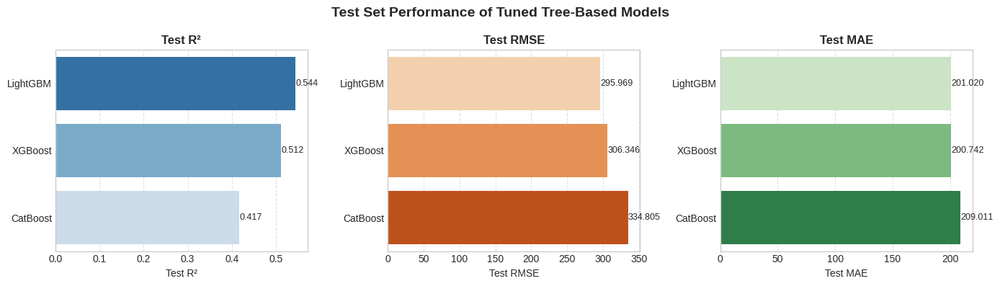

In [95]:
plt.figure(figsize = (14, 4))

metrics = ['Test R²', 'Test RMSE', 'Test MAE']
palettes = ['Blues_r', 'Oranges', 'Greens']

for i, metric in enumerate(metrics):
    plt.subplot(1, 3, i+1)
    ax = sns.barplot(x = metric, y = 'Model', data = results_df, palette = palettes[i])
    plt.title(metric, fontsize = 12, fontweight = 'bold')
    plt.xlabel(metric)
    plt.ylabel('')
    for container in ax.containers:
        ax.bar_label(container, fmt = '%.3f', fontsize = 9)
    plt.grid(axis = 'x', linestyle = '--', alpha = 0.6)

plt.suptitle("Test Set Performance of Tuned Tree-Based Models", fontsize = 14, fontweight = 'bold')
plt.tight_layout()
plt.show()

# **🎯 Predicting Salary for a Real Player from the Dataset**

In this section, we create a **custom salary prediction function** using the best-tuned models: **XGBoost, LightGBM, and CatBoost**. The function performs the following steps:

1. **Accepts a real player’s raw features** (before any encoding or scaling).
2. Applies **one-hot encoding** for categorical variables to match the training structure.
3. **Aligns feature columns** with the original training set (`X_train`), filling missing ones with zeros.
4. Uses the pre-fitted **scaler** to standardize numerical features.
5. Predicts salary using each of the three models:
   - `xgb_best`
   - `lgbm_best`
   - `cat_best`

We then demonstrate this function by selecting a **random real player from the test set**, extracting their original feature values from the main dataset (`df`), and generating predictions using the function.

🔍 **Output**: A dictionary of predicted salary values from each model, offering a comparative look at model performance on real, unseen player data.

---

In [96]:
def predict_salaries(player_features):
    """
    Predicts the salary of a baseball player using the tuned XGBoost, LightGBM,
    and CatBoost models.

    Args:
        player_features (dict or pd.Series): A dictionary or Series containing the
                                             player's features before one-hot encoding.

    Returns:
        dict: A dictionary with predicted salaries for each model.
    """
    # Convert input to DataFrame
    player_df = pd.DataFrame([player_features])

    # Apply one-hot encoding, ensuring consistency with training data columns
    categorical_features_predict = ['League', 'Division', 'NewLeague', 'ExperienceLevel'] 
    player_encoded = pd.get_dummies(player_df, columns = categorical_features_predict, drop_first = True)
    player_encoded = player_encoded.reindex(columns=X_train.columns, fill_value=0)


    # Scale the features using the fitted scaler
    player_scaled = scaler.transform(player_encoded)

    # Predict the salary using each of the best models
    predicted_salary_xgb = xgb_best.predict(player_scaled)[0]
    predicted_salary_lgbm = lgbm_best.predict(player_scaled)[0]
    predicted_salary_cat = cat_best.predict(player_scaled)[0]

    return {
        'XGBoost': predicted_salary_xgb,
        'LightGBM': predicted_salary_lgbm,
        'CatBoost': predicted_salary_cat
    }

In [97]:
# Select a sample player's features from the original df (before encoding)
sample_player_features_original = df.iloc[X_test.index[0]].drop('Salary')

# Convert the selected features into a dictionary format
sample_player_dict_original = sample_player_features_original.to_dict()

# Call the predict_salaries function with the dictionary of player features
predicted_salaries = predict_salaries(sample_player_dict_original)

# Print the predicted salaries for the sample player from each model
print("Predicted Salaries for sample player:")
for model, salary in predicted_salaries.items():
    print(f"- {model}: {salary:.6f}")

Predicted Salaries for sample player:
- XGBoost: 1525.216797
- LightGBM: 385.116997
- CatBoost: 965.716630
